In [88]:
import sys
sys.path.append('/project/FoolingDetection/pytorch')

import importlib
import lib.VisualizationProvider
import lib.FeatureProvider
import lib.StaticMetricProvider
importlib.reload(lib.VisualizationProvider)
importlib.reload(lib.FeatureProvider)
importlib.reload(lib.StaticMetricProvider)

from lib.VisualizationProvider import (plot_2d_distributions, 
                                       plot_2d_distributions2,
                                       plot_scatter, 
                                       plot_scatter2,
                                       plot_gaussian_distributions,
                                       plot_heatmap,
                                       plot_comparison_heatmaps
                                      )

from lib.FeatureProvider import (load_all_grids, 
                                 load_all_grids_randparams,
                                 reduce_dimensionality_umap, 
                                 reduce_dimensionality_kpca, 
                                 reduce_dimensionality_tsne
                                )

from lib.StaticMetricProvider import (test_all_introspection_technique_combinations, 
                                      calc_distributions, 
                                      get_values_from_distance_matrix, 
                                      difference_distances, 
                                      apply_log_to_distances,
                                      calculate_stats
                                     )
from umap import UMAP
from sklearn.manifold import TSNE
from sklearn.decomposition import KernelPCA

# Base Code 

In [2]:
MODEL_TYPE = "mlp"
DATASET = "mnist"
ATTACK1 = "correct"
ATTACK2 = "RandLabels"
ATTACK3 = "RandParams/Cascading/4_Linear"
MAX_IMAGES = 300
RANDOM_STATE = 42
NUMBER_COMPONENTS = 2

In [3]:
all_grids_1 = load_all_grids(
    model_type=MODEL_TYPE, 
    dataset=DATASET, 
    attack=ATTACK1, 
    max_images=MAX_IMAGES
)
all_grids_2 = load_all_grids(
    model_type=MODEL_TYPE, 
    dataset=DATASET, 
    attack=ATTACK2, 
    max_images=MAX_IMAGES
)

all_grids_3 = load_all_grids(
    model_type=MODEL_TYPE, 
    dataset=DATASET, 
    attack=ATTACK3, 
    max_images=MAX_IMAGES
)

distances_1, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_1, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_2, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_2, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_3, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_3, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)

difference_NoAttacked_RandLabels = difference_distances(
    reference=distances_1, 
    delta=distances_2, 
    fold_change_and_log_scale=True
)

difference_NoAttacked_RandParams = difference_distances(
    reference=distances_1, 
    delta=distances_3, 
    fold_change_and_log_scale=True
)

Loading grids from disk...
Loading image 50 out of 300 (16.67%)
Loading image 100 out of 300 (33.33%)
Loading image 150 out of 300 (50.00%)
Loading image 200 out of 300 (66.67%)
Loading image 250 out of 300 (83.33%)
Loading image 300 out of 300 (100.00%)
Loading grids from disk...
Loading image 50 out of 300 (16.67%)
Loading image 100 out of 300 (33.33%)
Loading image 150 out of 300 (50.00%)
Loading image 200 out of 300 (66.67%)
Loading image 250 out of 300 (83.33%)
Loading image 300 out of 300 (100.00%)
Loading grids from disk...
Loading image 50 out of 300 (16.67%)
Loading image 100 out of 300 (33.33%)
Loading image 150 out of 300 (50.00%)
Loading image 200 out of 300 (66.67%)
Loading image 250 out of 300 (83.33%)
Loading image 300 out of 300 (100.00%)
Loading grids from disk...
Loading image 50 out of 300 (16.67%)
Loading image 100 out of 300 (33.33%)
Loading image 150 out of 300 (50.00%)
Loading image 200 out of 300 (66.67%)
Loading image 250 out of 300 (83.33%)
Loading image 300 o

In [6]:
# UMap Reducer Object
umap_reducer = UMAP(n_components=NUMBER_COMPONENTS, random_state=RANDOM_STATE, n_jobs=-1)


# UMap Transform
all_grids_1_umap = reduce_dimensionality_umap(all_grids_1, umap_reducer)
all_grids_2_umap = reduce_dimensionality_umap(all_grids_2, umap_reducer)
all_grids_3_umap = reduce_dimensionality_umap(all_grids_3, umap_reducer)


distances_umap_1, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_1_umap, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_umap_2, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_2_umap, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_umap_3, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_3_umap, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)

difference_umap_NoAttacked_RandLabels = difference_distances(
    reference=distances_umap_1, 
    delta=distances_umap_2, 
    fold_change_and_log_scale=True
)

difference_umap_NoAttacked_RandParams = difference_distances(
    reference=distances_umap_1, 
    delta=distances_umap_3, 
    fold_change_and_log_scale=True
)

Reducing dimensionality for technique backprop...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/scratch/ponel/python/lib/python3.8/site-packages/sklearn/manifold/_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Reducing dimensionality for technique dl...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique g_t_i...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique ig...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique vgrads...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/scratch/ponel/python/lib/python3.8/site-packages/sklearn/manifold/_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Reducing dimensionality for technique backprop...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique dl...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique g_t_i...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique ig...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique vgrads...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/scratch/ponel/python/lib/python3.8/site-packages/sklearn/manifold/_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Reducing dimensionality for technique backprop...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/scratch/ponel/python/lib/python3.8/site-packages/sklearn/manifold/_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Reducing dimensionality for technique dl...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique g_t_i...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique ig...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique vgrads...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/scratch/ponel/python/lib/python3.8/site-packages/sklearn/manifold/_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


In [7]:
# TSNE Reducer Object
tsne_reducer = TSNE(n_components=NUMBER_COMPONENTS, random_state=RANDOM_STATE, n_jobs=-1)


# TSNE Transform
all_grids_1_tsne =reduce_dimensionality_tsne(all_grids_1, tsne_reducer)
all_grids_2_tsne =reduce_dimensionality_tsne(all_grids_2, tsne_reducer)
all_grids_3_tsne =reduce_dimensionality_tsne(all_grids_3, tsne_reducer)

distances_tsne_1, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_1_tsne, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_tsne_2, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_2_tsne, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_tsne_3, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_3_tsne, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)

difference_tsne_NoAttacked_RandLabels = difference_distances(
    reference=distances_tsne_1, 
    delta=distances_tsne_2, 
    fold_change_and_log_scale=True
)

difference_tsne_NoAttacked_RandParams = difference_distances(
    reference=distances_tsne_1, 
    delta=distances_tsne_3, 
    fold_change_and_log_scale=True
)

Reducing dimensionality for technique backprop...
Reducing dimensionality for technique dl...
Reducing dimensionality for technique g_t_i...
Reducing dimensionality for technique ig...
Reducing dimensionality for technique vgrads...
Reducing dimensionality for technique backprop...
Reducing dimensionality for technique dl...
Reducing dimensionality for technique g_t_i...
Reducing dimensionality for technique ig...
Reducing dimensionality for technique vgrads...
Reducing dimensionality for technique backprop...
Reducing dimensionality for technique dl...
Reducing dimensionality for technique g_t_i...
Reducing dimensionality for technique ig...
Reducing dimensionality for technique vgrads...


In [8]:
# kPCA Transform
# kPCA-Linear Reducer Object
kpca_linear_reducer = KernelPCA(
        n_components=NUMBER_COMPONENTS, 
        kernel="linear", 
        gamma=.1, 
        eigen_solver="auto", 
        random_state=RANDOM_STATE, 
        alpha=10)

# Linear kernel
all_grids_1_kpca_linear = reduce_dimensionality_kpca(all_grids_1, kpca_linear_reducer)
all_grids_2_kpca_linear = reduce_dimensionality_kpca(all_grids_2, kpca_linear_reducer)
all_grids_3_kpca_linear = reduce_dimensionality_kpca(all_grids_3, kpca_linear_reducer)

distances_kcpa_linear_1, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_1_kpca_linear, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_kcpa_linear_2, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_2_kpca_linear, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_kcpa_linear_3, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_3_kpca_linear, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)

difference_kpca_linear_NoAttacked_RandLabels = difference_distances(
    reference=distances_kcpa_linear_1, 
    delta=distances_kcpa_linear_2, 
    fold_change_and_log_scale=True
)

difference_kpca_linear_NoAttacked_RandParams = difference_distances(
    reference=distances_kcpa_linear_1, 
    delta=distances_kcpa_linear_3, 
    fold_change_and_log_scale=True
)

# Poly kernel

# kPCA-Poly Reducer Object
kpca_poly_reducer = KernelPCA(
        n_components=NUMBER_COMPONENTS, 
        kernel="poly", 
        gamma=.1, 
        eigen_solver="auto", 
        random_state=RANDOM_STATE, 
        alpha=10)

all_grids_1_kpca_poly = reduce_dimensionality_kpca(all_grids_1, kpca_poly_reducer)
all_grids_2_kpca_poly = reduce_dimensionality_kpca(all_grids_2, kpca_poly_reducer)
all_grids_3_kpca_poly = reduce_dimensionality_kpca(all_grids_3, kpca_poly_reducer)

distances_kcpa_poly_1, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_1_kpca_poly, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_kcpa_poly_2, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_2_kpca_poly, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_kcpa_poly_3, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_3_kpca_poly, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)

difference_kpca_poly_NoAttacked_RandLabels = difference_distances(
    reference=distances_kcpa_poly_1, 
    delta=distances_kcpa_poly_2, 
    fold_change_and_log_scale=True
)

difference_kpca_poly_NoAttacked_RandParams = difference_distances(
    reference=distances_kcpa_poly_1, 
    delta=distances_kcpa_poly_3, 
    fold_change_and_log_scale=True
)

# Cosine kernel
# kPCA-Cosine Reducer Object
kpca_cosine_reducer = KernelPCA(
        n_components=NUMBER_COMPONENTS, 
        kernel="cosine", 
        gamma=.1, 
        eigen_solver="auto", 
        random_state=RANDOM_STATE, 
        alpha=10)

all_grids_1_kpca_cosine = reduce_dimensionality_kpca(all_grids_1, kpca_cosine_reducer)
all_grids_2_kpca_cosine = reduce_dimensionality_kpca(all_grids_2, kpca_cosine_reducer)
all_grids_3_kpca_cosine = reduce_dimensionality_kpca(all_grids_3, kpca_cosine_reducer)

distances_kcpa_cosine_1, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_1_kpca_cosine, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_kcpa_cosine_2, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_2_kpca_cosine, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_kcpa_cosine_3, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_3_kpca_cosine, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)

difference_kpca_cosine_NoAttacked_RandLabels = difference_distances(
    reference=distances_kcpa_cosine_1, 
    delta=distances_kcpa_cosine_2, 
    fold_change_and_log_scale=True
)

difference_kpca_cosine_NoAttacked_RandParams = difference_distances(
    reference=distances_kcpa_cosine_1, 
    delta=distances_kcpa_cosine_3, 
    fold_change_and_log_scale=True
)

Reducing dimensionality for technique backprop...
Reducing dimensionality for technique dl...
Reducing dimensionality for technique g_t_i...
Reducing dimensionality for technique ig...
Reducing dimensionality for technique vgrads...
Reducing dimensionality for technique backprop...
Reducing dimensionality for technique dl...
Reducing dimensionality for technique g_t_i...
Reducing dimensionality for technique ig...
Reducing dimensionality for technique vgrads...
Reducing dimensionality for technique backprop...
Reducing dimensionality for technique dl...
Reducing dimensionality for technique g_t_i...
Reducing dimensionality for technique ig...
Reducing dimensionality for technique vgrads...
Reducing dimensionality for technique backprop...
Reducing dimensionality for technique dl...
Reducing dimensionality for technique g_t_i...
Reducing dimensionality for technique ig...
Reducing dimensionality for technique vgrads...
Reducing dimensionality for technique backprop...
Reducing dimension

# Lower-Dimensional Comparison (Aggregated)
Map the unattacked and an attacked version to a lower_dim space (n=2) and see how the distributions in this lower-dim space differ!

## Normal (Left) vs. RandLabels (Middle) vs. RandParams (Right)

### UMap

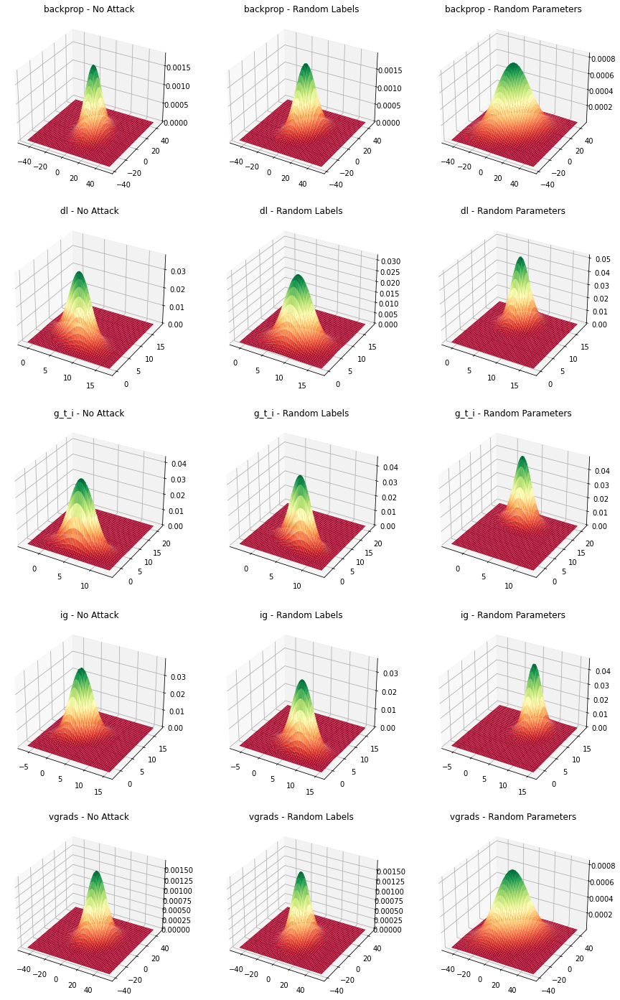

In [89]:
plot_2d_distributions2(all_grids_1_umap, all_grids_2_umap, all_grids_3_umap, title1="No Attack", title2="Random Labels", title3="Random Parameters")

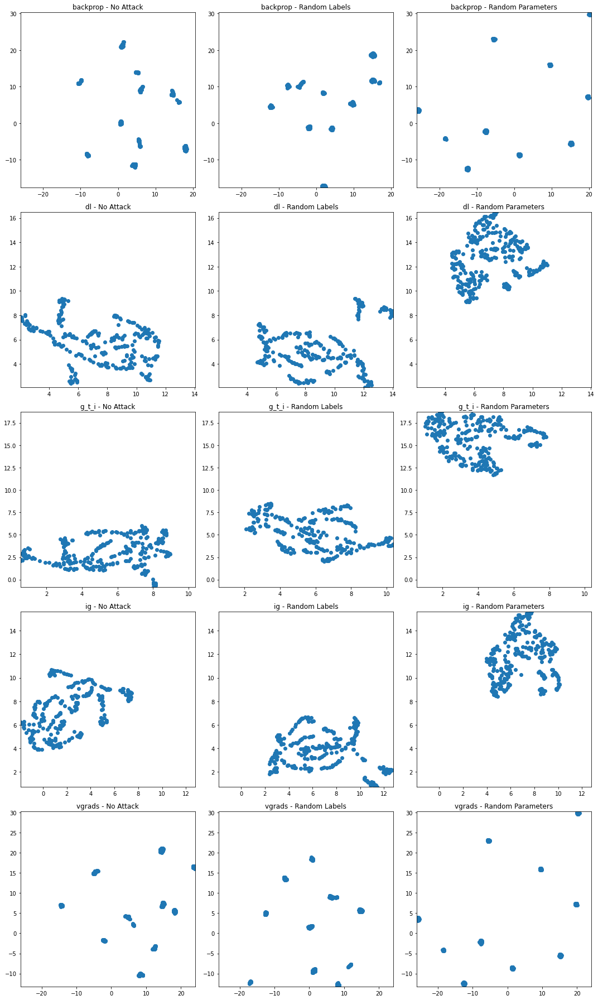

In [90]:
plot_scatter2(all_grids_1_umap, all_grids_2_umap, all_grids_3_umap, title1="No Attack", title2="Random Labels", title3="Random Parameters")

In [91]:
calculate_stats(all_grids_1_umap, all_grids_2_umap,  all_grids_3_umap)

,Technique,Grid,Mean(1),Standard Deviation(1),Mean(2),Standard Deviation(2)
0,backprop,Grids 1,5.066466,8.418124,2.841614,10.608658
1,backprop,Grids 2,3.589759,8.973914,5.384284,9.764956
2,backprop,Grids 3,-0.936261,15.562675,4.072283,13.519825
3,dl,Grids 1,7.307064,2.685631,5.723174,1.718989
4,dl,Grids 2,8.986132,2.713357,5.348068,1.882756
5,dl,Grids 3,7.082235,1.678661,12.662234,1.868543
6,g_t_i,Grids 1,5.459622,2.345686,3.012704,1.597529
7,g_t_i,Grids 2,5.886334,2.175605,5.314973,1.745264
8,g_t_i,Grids 3,3.900302,1.747262,15.623480,1.914082
9,ig,Grids 1,2.148678,2.445155,7.209507,1.856282


### kPCA (Linear)

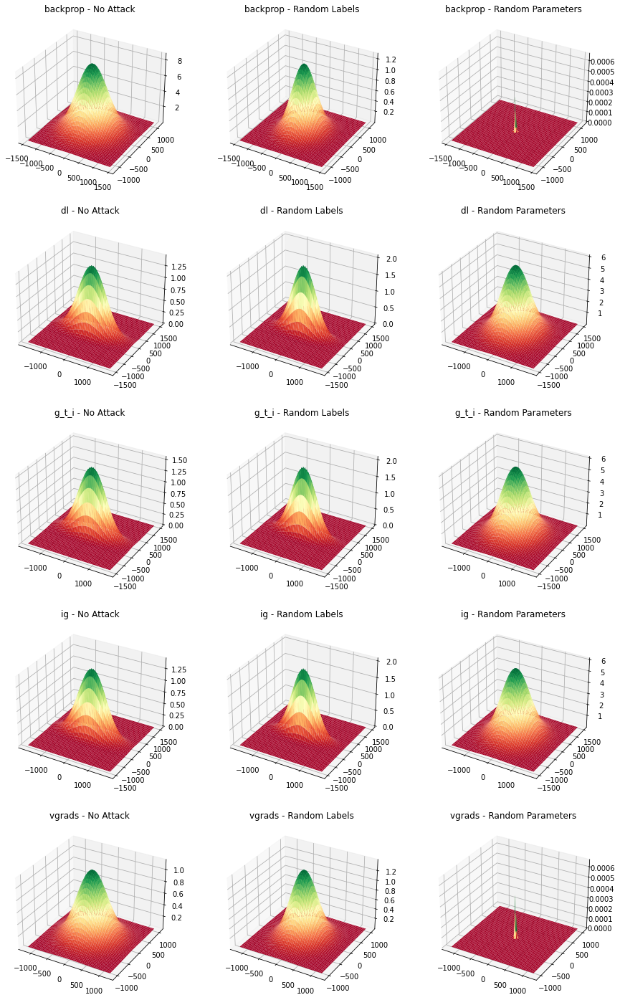

In [92]:
plot_2d_distributions2(all_grids_1_kpca_linear, all_grids_2_kpca_linear, all_grids_3_kpca_linear, title1="No Attack", title2="Random Labels", title3="Random Parameters")

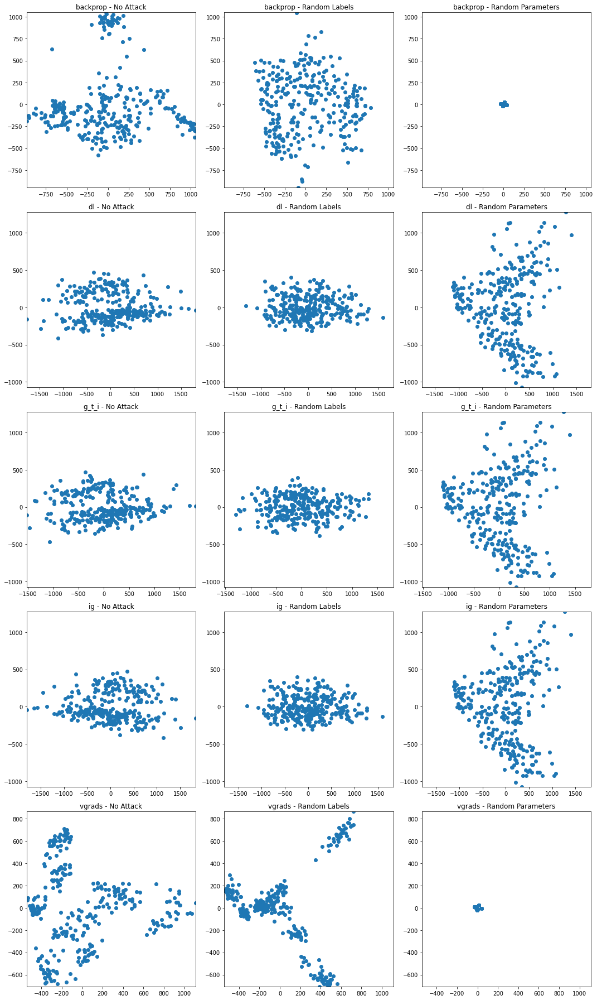

In [93]:
plot_scatter2(all_grids_1_kpca_linear, all_grids_2_kpca_linear, all_grids_3_kpca_linear, title1="No Attack", title2="Random Labels", title3="Random Parameters")

In [94]:
calculate_stats(all_grids_1_kpca_linear, all_grids_2_kpca_linear, all_grids_3_kpca_linear)

,Technique,Grid,Mean(1),Standard Deviation(1),Mean(2),Standard Deviation(2)
0,backprop,Grids 1,9.094947e-15,478.965988,-1.076235e-13,383.642266
1,backprop,Grids 2,-1.015602e-13,363.719506,6.139089e-14,342.498798
2,backprop,Grids 3,9.688961e-13,20.066010,2.833265e-12,12.068686
3,dl,Grids 1,-1.818989e-14,582.858506,1.712882e-13,188.289720
4,dl,Grids 2,5.456968e-14,509.588309,-5.911716e-14,152.889229
5,dl,Grids 3,1.818989e-14,535.875630,-9.094947e-15,491.870151
6,g_t_i,Grids 1,1.818989e-14,571.636352,1.909939e-13,180.818200
7,g_t_i,Grids 2,5.911716e-14,515.620025,1.508245e-13,149.480925
8,g_t_i,Grids 3,3.334814e-14,535.875370,1.212660e-14,491.870234
9,ig,Grids 1,-1.818989e-14,585.514629,-3.637979e-14,188.268453


### kPCA (poly)

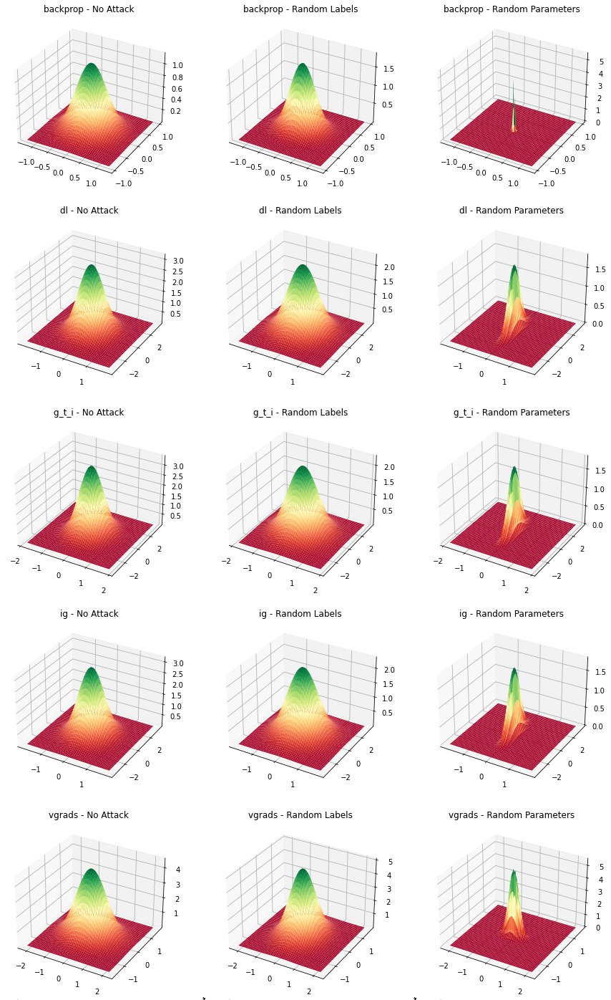

In [95]:
plot_2d_distributions2(all_grids_1_kpca_poly, all_grids_2_kpca_poly, all_grids_3_kpca_poly, title1="No Attack", title2="Random Labels", title3="Random Parameters")

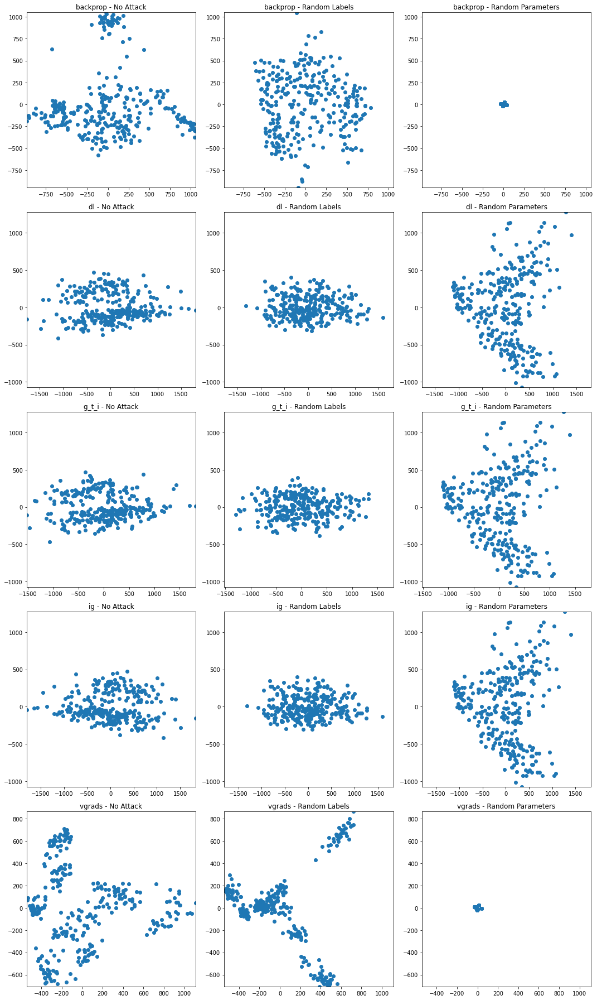

In [96]:
plot_scatter2(all_grids_1_kpca_linear, all_grids_2_kpca_linear, all_grids_3_kpca_linear, title1="No Attack", title2="Random Labels", title3="Random Parameters")

In [97]:
calculate_stats(all_grids_1_kpca_linear, all_grids_2_kpca_linear, all_grids_3_kpca_linear)

,Technique,Grid,Mean(1),Standard Deviation(1),Mean(2),Standard Deviation(2)
0,backprop,Grids 1,9.094947e-15,478.965988,-1.076235e-13,383.642266
1,backprop,Grids 2,-1.015602e-13,363.719506,6.139089e-14,342.498798
2,backprop,Grids 3,9.688961e-13,20.066010,2.833265e-12,12.068686
3,dl,Grids 1,-1.818989e-14,582.858506,1.712882e-13,188.289720
4,dl,Grids 2,5.456968e-14,509.588309,-5.911716e-14,152.889229
5,dl,Grids 3,1.818989e-14,535.875630,-9.094947e-15,491.870151
6,g_t_i,Grids 1,1.818989e-14,571.636352,1.909939e-13,180.818200
7,g_t_i,Grids 2,5.911716e-14,515.620025,1.508245e-13,149.480925
8,g_t_i,Grids 3,3.334814e-14,535.875370,1.212660e-14,491.870234
9,ig,Grids 1,-1.818989e-14,585.514629,-3.637979e-14,188.268453


### kPCA (cosine)

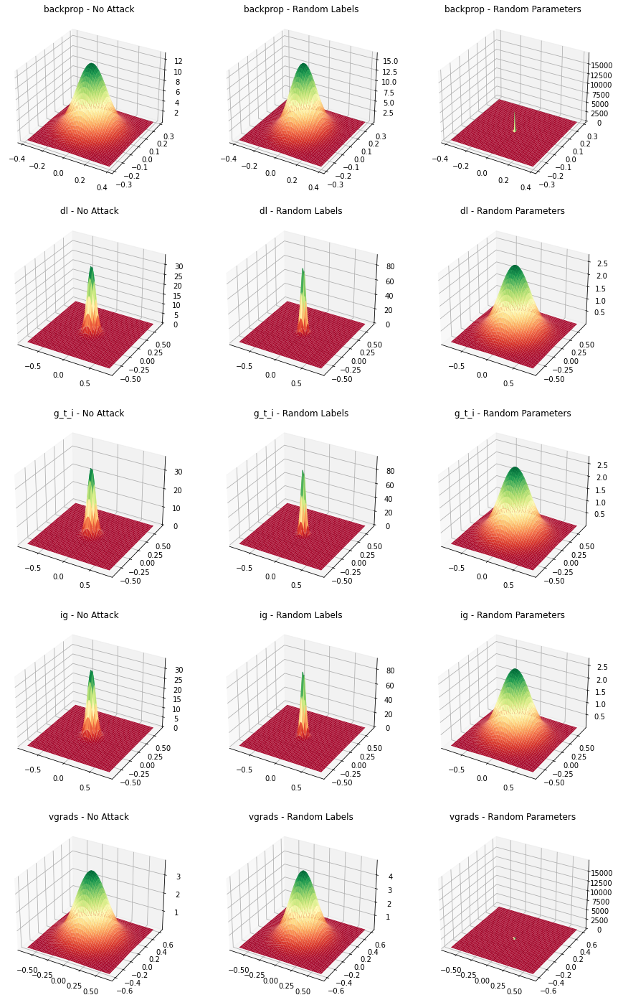

In [98]:
plot_2d_distributions2(all_grids_1_kpca_cosine, all_grids_2_kpca_cosine, all_grids_3_kpca_cosine, title1="No Attack", title2="Random Labels", title3="Random Parameters")

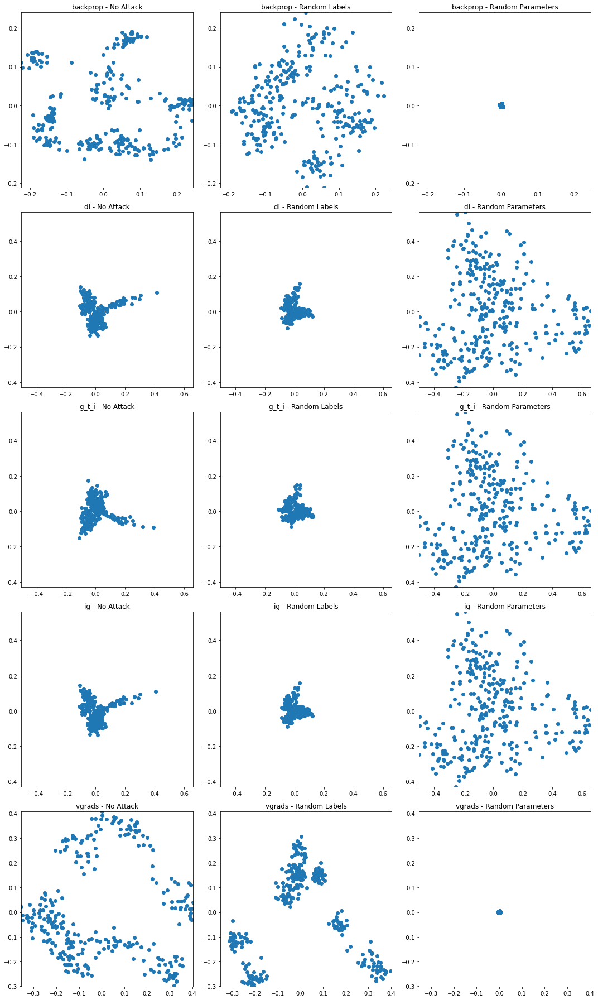

In [99]:
plot_scatter2(all_grids_1_kpca_cosine, all_grids_2_kpca_cosine, all_grids_3_kpca_cosine, title1="No Attack", title2="Random Labels", title3="Random Parameters")

In [100]:
calculate_stats(all_grids_1_kpca_cosine, all_grids_2_kpca_cosine, all_grids_3_kpca_cosine)

,Technique,Grid,Mean(1),Standard Deviation(1),Mean(2),Standard Deviation(2)
0,backprop,Grids 1,3.256654e-17,0.129059,5.210647e-16,0.095071
1,backprop,Grids 2,2.442491e-17,0.104058,2.864375e-16,0.093848
2,backprop,Grids 3,-2.413900e-13,0.003085,4.080834e-14,0.002951
3,dl,Grids 1,2.116825e-16,0.074860,-5.051515e-16,0.062096
4,dl,Grids 2,-4.209596e-16,0.044285,-3.123427e-16,0.039011
5,dl,Grids 3,1.480297e-18,0.265240,3.330669e-17,0.219881
6,g_t_i,Grids 1,-9.732955e-17,0.071713,-1.016964e-15,0.060774
7,g_t_i,Grids 2,-9.283315e-16,0.044057,5.934142e-16,0.037582
8,g_t_i,Grids 3,-8.881784e-18,0.265240,3.700743e-18,0.219881
9,ig,Grids 1,-7.201647e-16,0.074570,-1.998401e-17,0.062135


### t-SNE

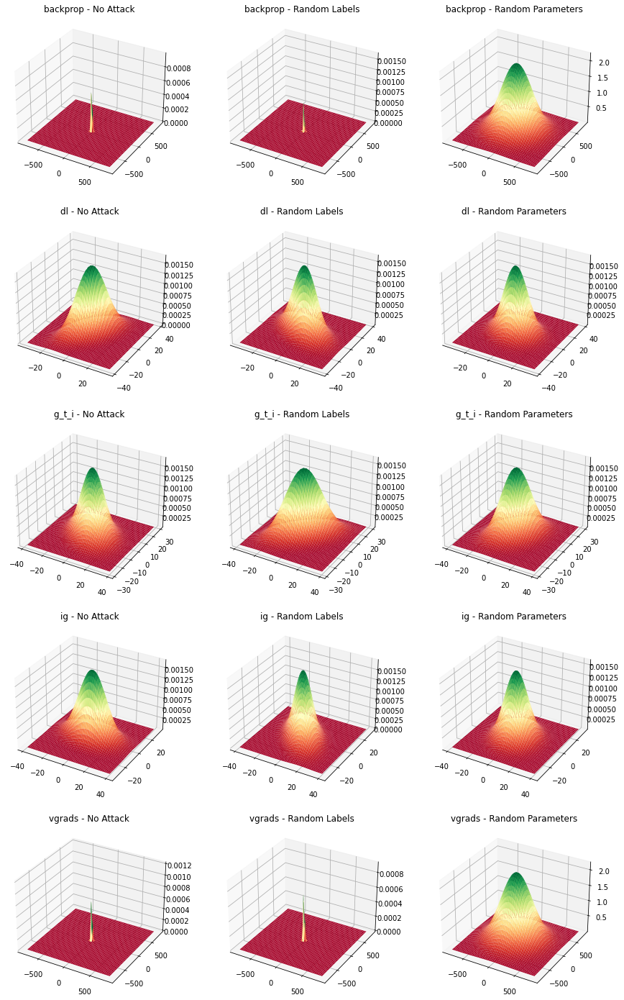

In [101]:
# (this execution works but takes ages...)
plot_2d_distributions2(all_grids_1_tsne, all_grids_2_tsne, all_grids_3_tsne, title1="No Attack", title2="Random Labels", title3="Random Parameters")

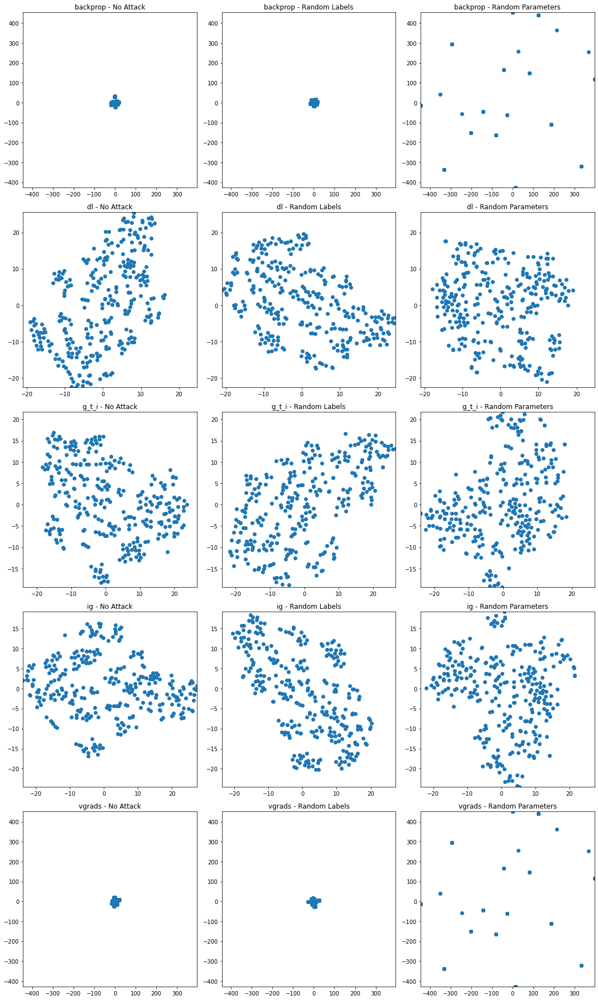

In [102]:
plot_scatter2(all_grids_1_tsne, all_grids_2_tsne, all_grids_3_tsne, title1="No Attack", title2="Random Labels", title3="Random Parameters")

In [103]:
calculate_stats(all_grids_1_tsne, all_grids_2_tsne, all_grids_3_tsne)

,Technique,Grid,Mean(1),Standard Deviation(1),Mean(2),Standard Deviation(2)
0,backprop,Grids 1,-0.678281,11.999665,0.951815,13.521085
1,backprop,Grids 2,-0.107448,10.089004,0.302840,9.718546
2,backprop,Grids 3,-0.793055,265.896606,-1.550623,270.773682
3,dl,Grids 1,-0.344060,8.825033,0.421765,12.525814
4,dl,Grids 2,0.485822,11.565089,0.795864,9.417294
5,dl,Grids 3,-0.315209,9.899551,0.005050,9.584265
6,g_t_i,Grids 1,0.820848,11.542502,0.677056,8.632626
7,g_t_i,Grids 2,0.105708,12.664907,0.190618,9.343754
8,g_t_i,Grids 3,-0.425797,10.449876,0.710264,9.406413
9,ig,Grids 1,0.819324,13.103383,0.335198,7.349608


# Per-Image Comparison 
For a combination of two Explanation Techniques (expl1, expl2) (e.g. expl1=DeepLift, expl2=vanillaGrads) compute the distance for each image in a **Lower and High Dimensional Space**. Finally, plot the distributions. 

This is also done for the difference of the distances. For this the distances for an attacked and non-attacked versions are calculated and then the difference is calculated using the fold_change on a logarithmic scale. Finally, this is plotted aswell.

In [104]:
METRIC="euclidean"

## High-Dimensional 

### No Attack

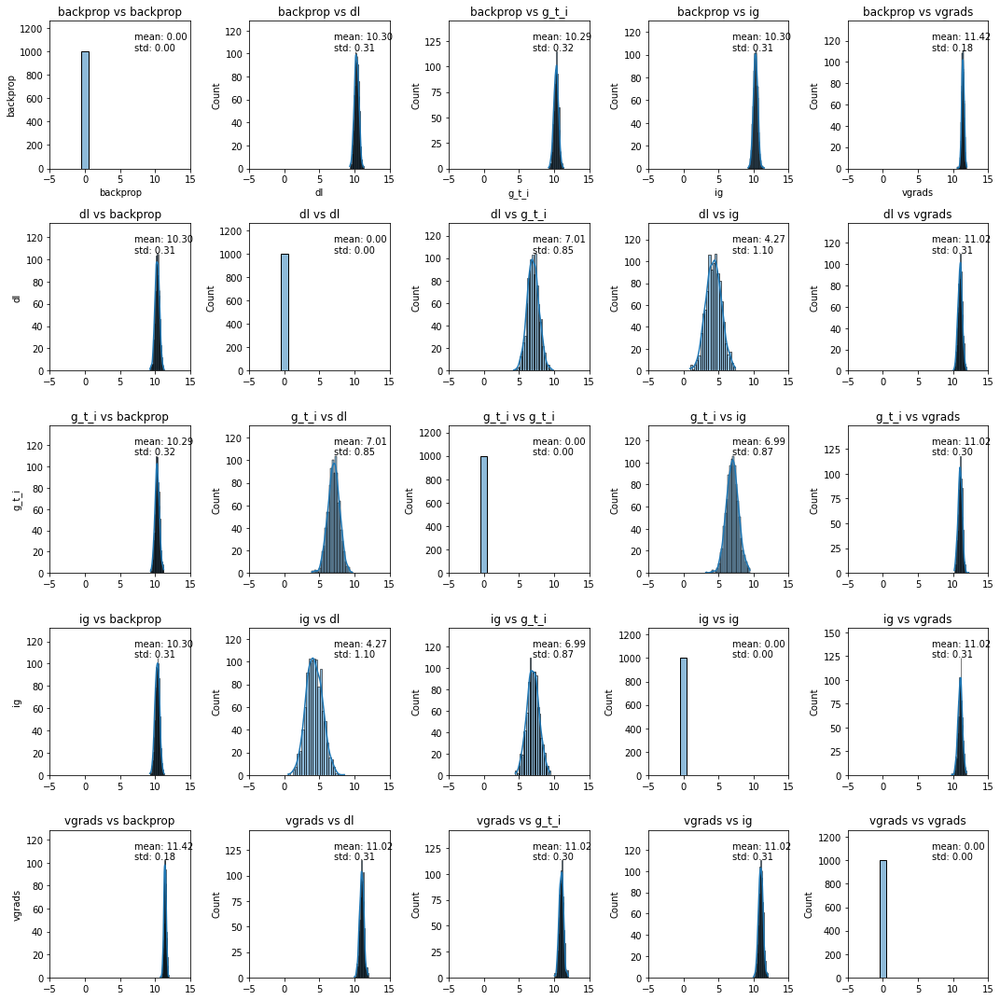

In [105]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_1), 
    techniques=list(techniques), 
    metric=METRIC,
    value_range=(-5, 15),
    save_name="Distributions_NoAttack_Mnist_cnn.png"

)

### RandLabels Attack

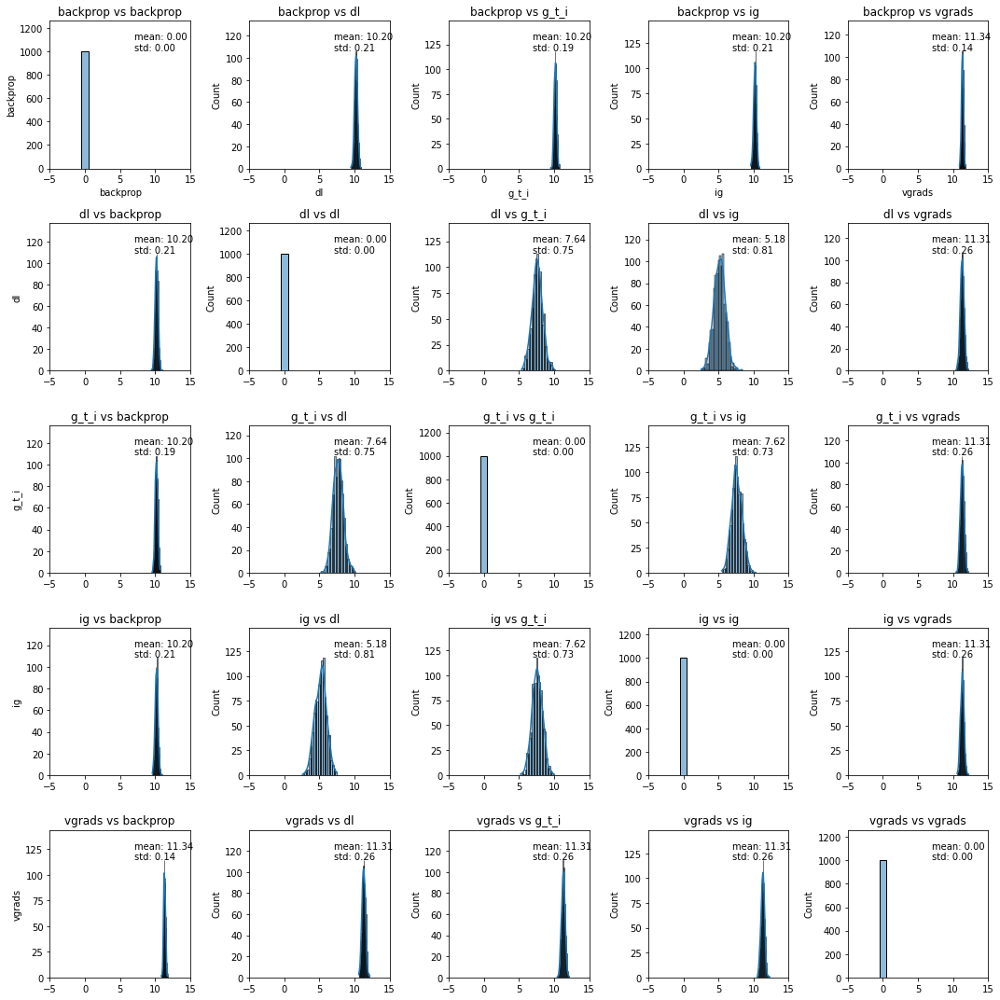

In [106]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_2), 
    techniques=list(techniques), 
    metric=METRIC,
    value_range=(-5, 15),
    save_name="Distributions_RandLabels_Mnist_cnn.png"
)

### RandParams Attack

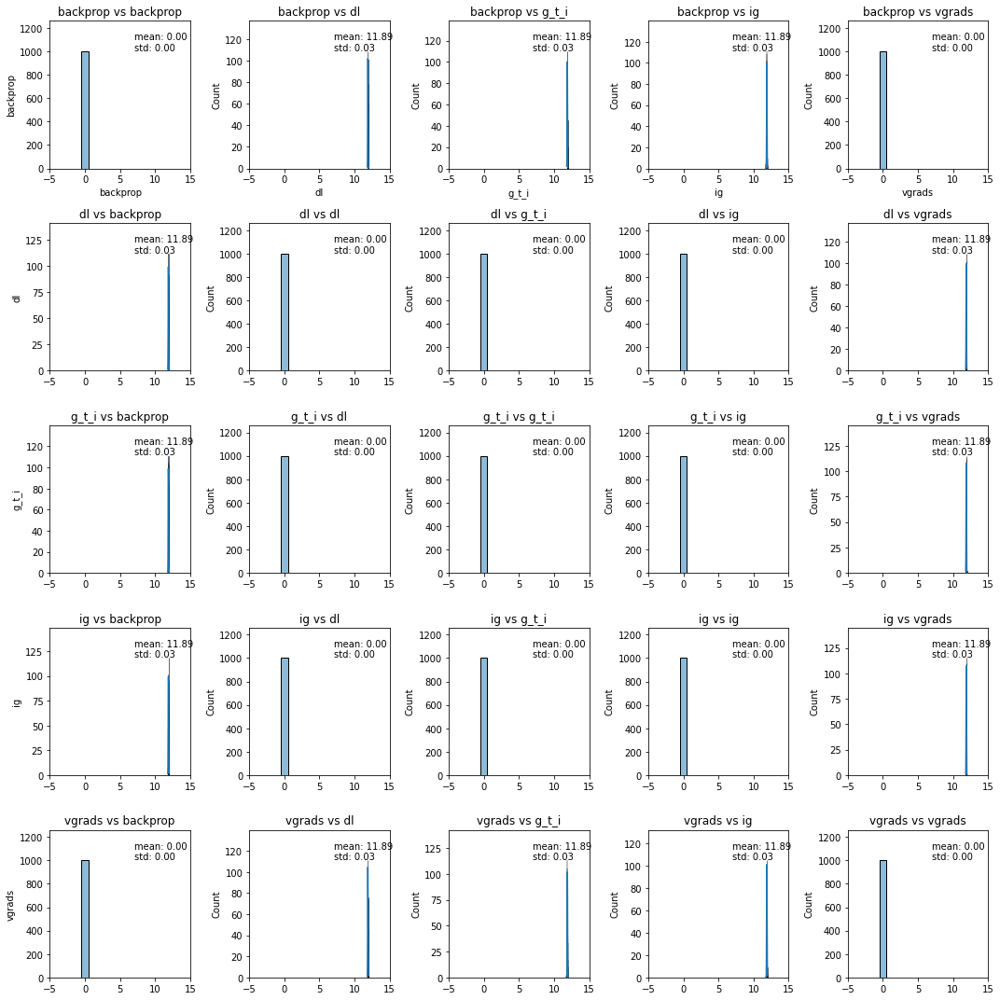

In [107]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_3), 
    techniques=list(techniques), 
    metric=METRIC,
    value_range=(-5, 15),
    save_name="Distributions_RandParams_Mnist_cnn.png"
)

### No Attack vs. RandLabels (Difference)

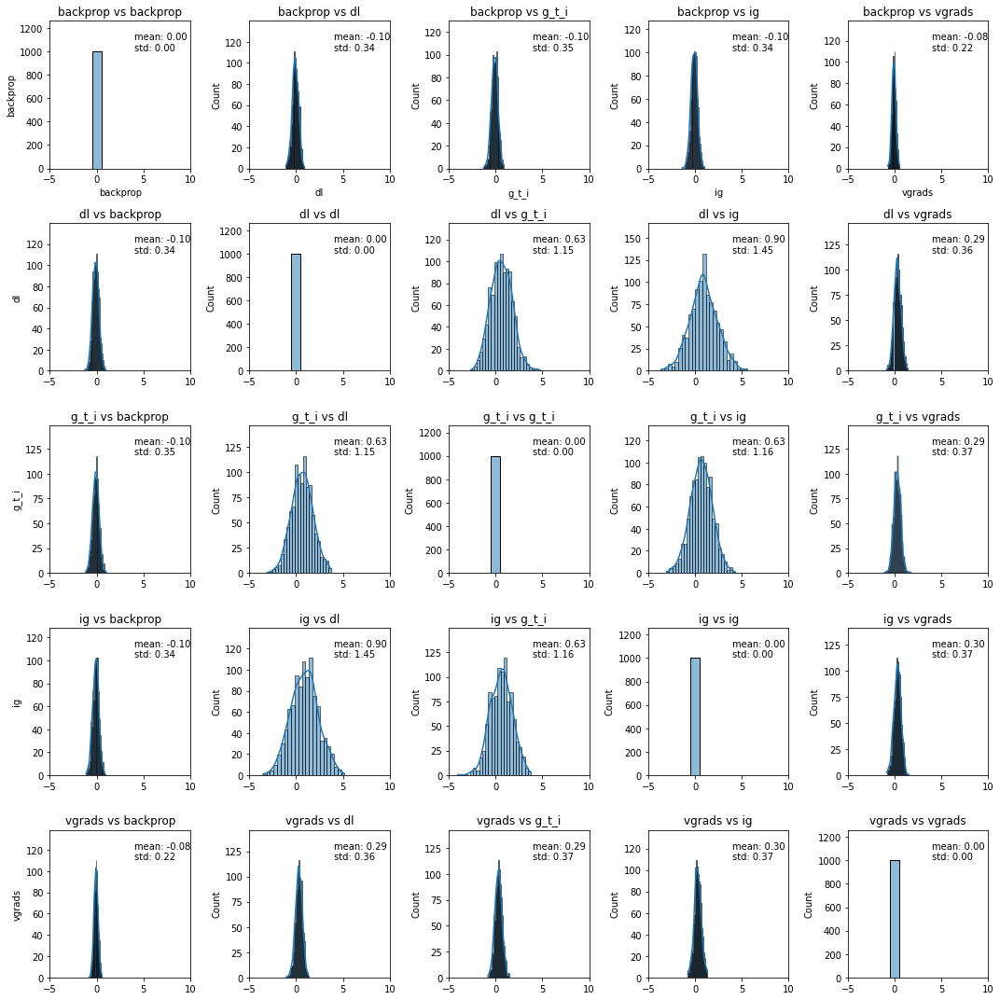

In [108]:
plot_gaussian_distributions(
    distances=difference_NoAttacked_RandLabels, 
    techniques=list(techniques), 
    metric=METRIC,
    value_range=(-5, 10),
    save_name="Distributions_NoAttack_RandLabels_Mnist_cnn_diff.png"
)

### No Attack vs. RandParams (Difference)

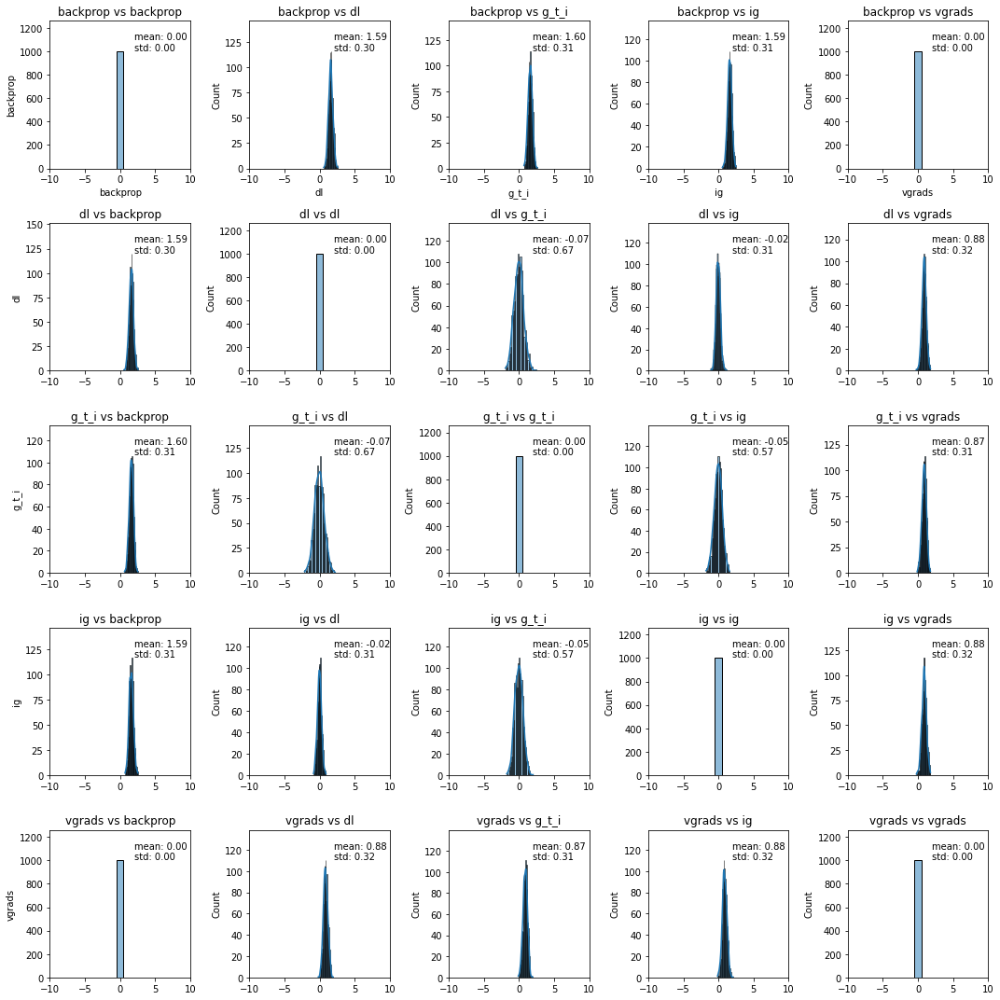

In [109]:
plot_gaussian_distributions(
    distances=difference_NoAttacked_RandParams, 
    techniques=list(techniques), 
    metric=METRIC,
    value_range=(-10, 10),
    save_name="Distributions_NoAttack_RandParams_Mnist_cnn_diff.png"
)

## UMap

### No Attack

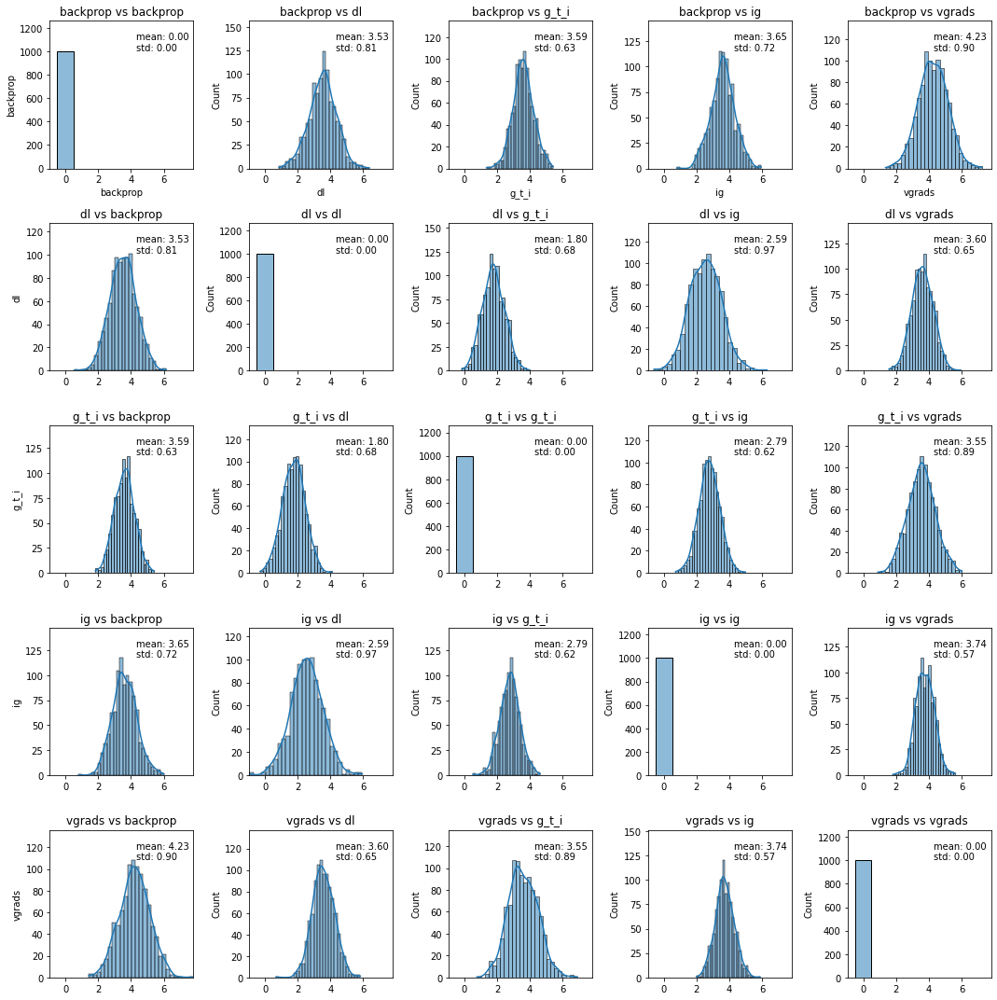

In [110]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_umap_1), 
    techniques=list(techniques), 
    metric=METRIC
)

### RandLabels Attack

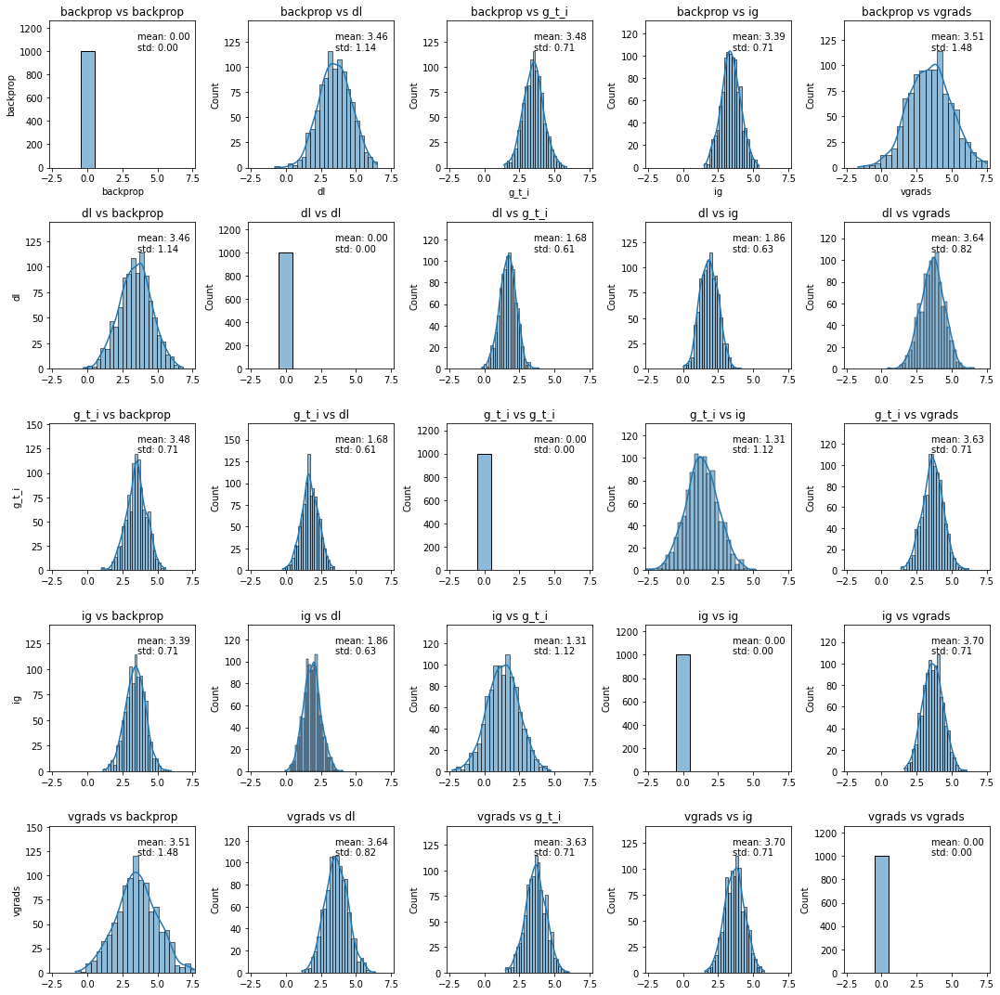

In [111]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_umap_2), 
    techniques=list(techniques), 
    metric=METRIC
)

### RandParams Attack

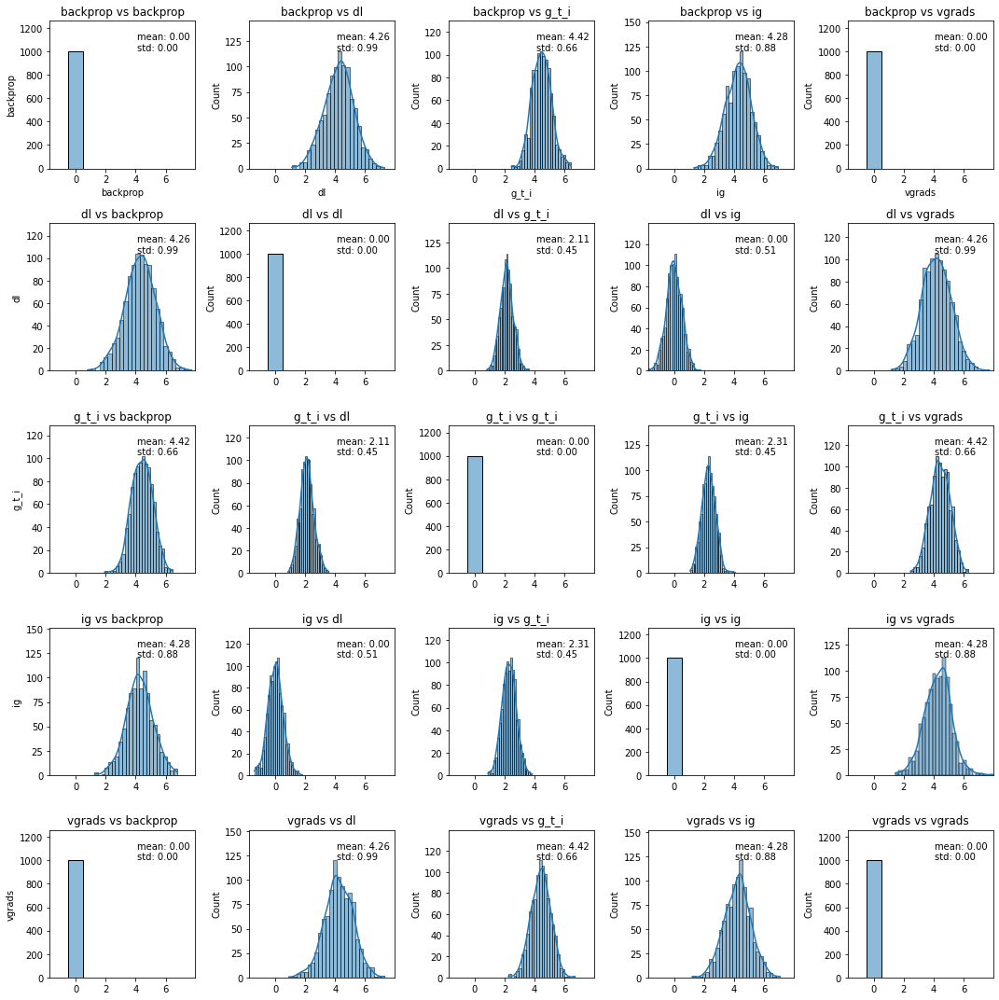

In [112]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_umap_3), 
    techniques=list(techniques), 
    metric=METRIC
)

### No Attack vs. RandLabels (Difference)

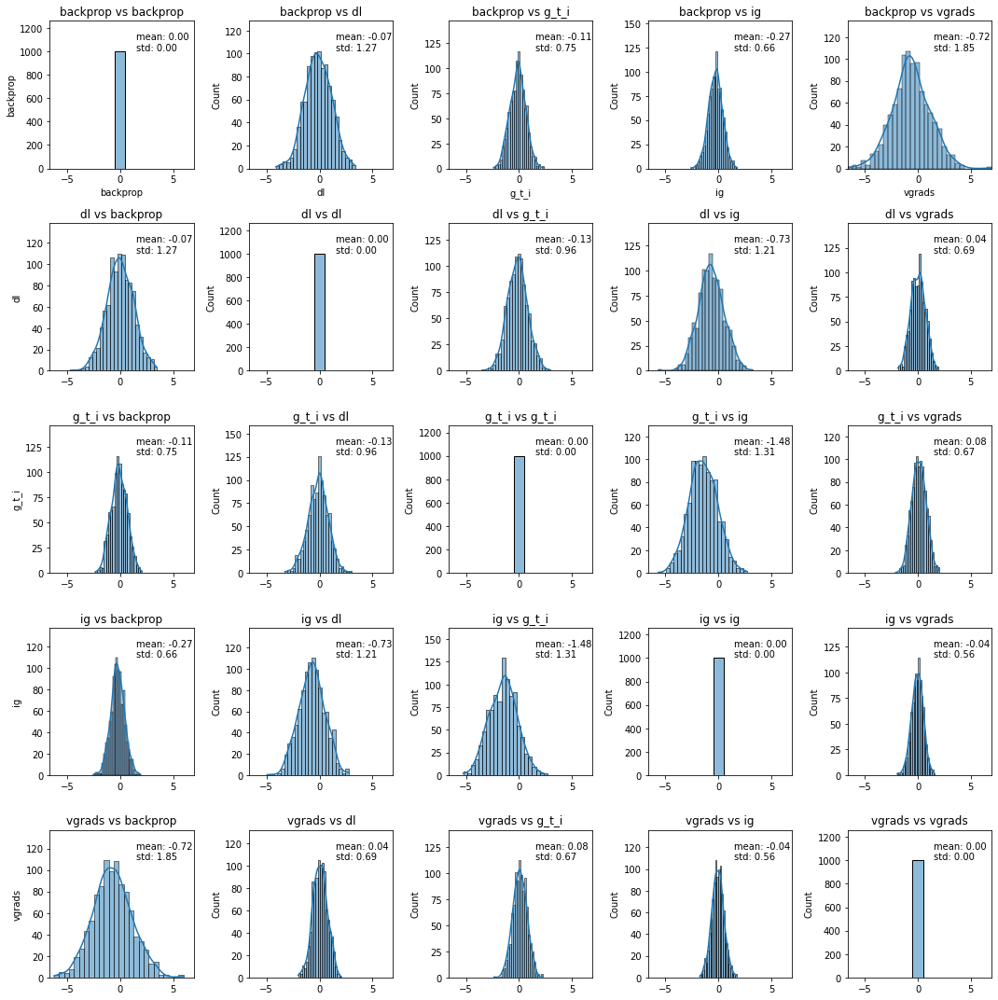

In [113]:
plot_gaussian_distributions(
    distances=difference_umap_NoAttacked_RandLabels, 
    techniques=list(techniques), 
    metric=METRIC
)

### No Attack vs. RandParams (Difference)

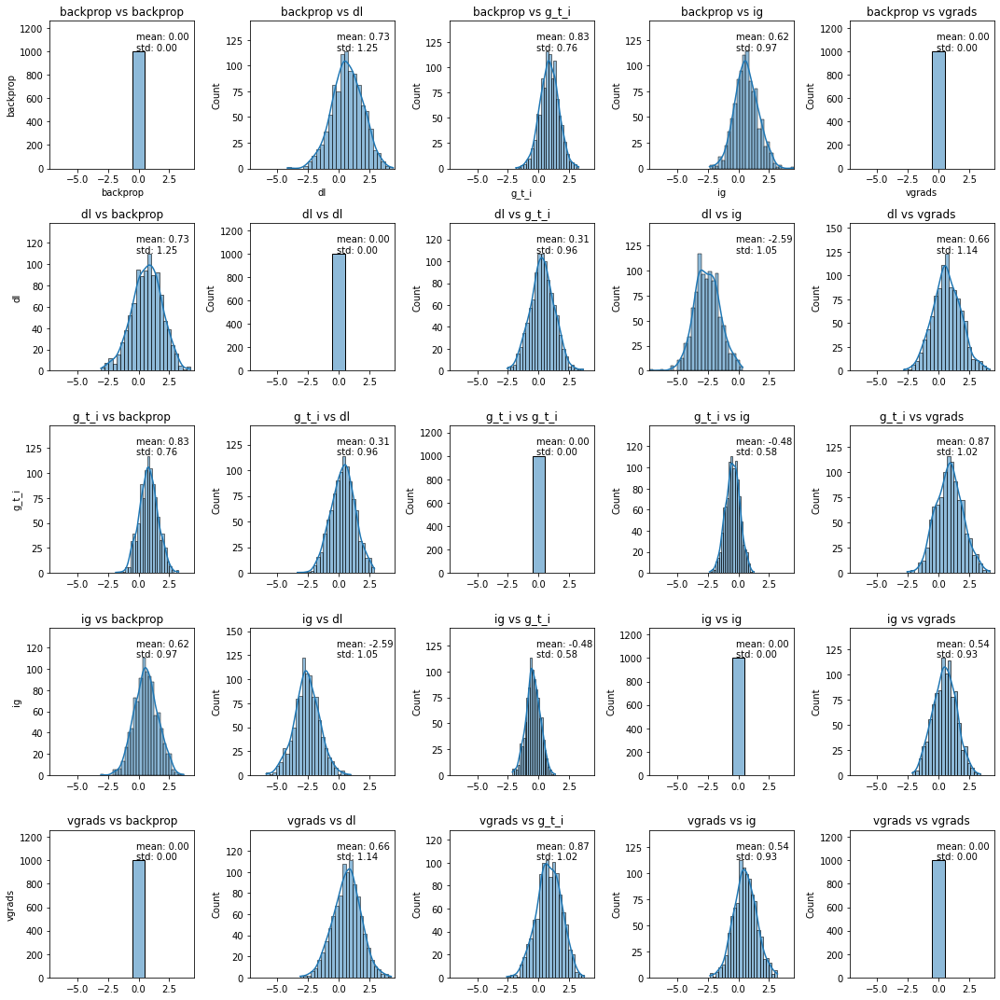

In [114]:
plot_gaussian_distributions(
    distances=difference_umap_NoAttacked_RandParams, 
    techniques=list(techniques), 
    metric=METRIC
)

## kPCA (Linear)

### No Attack

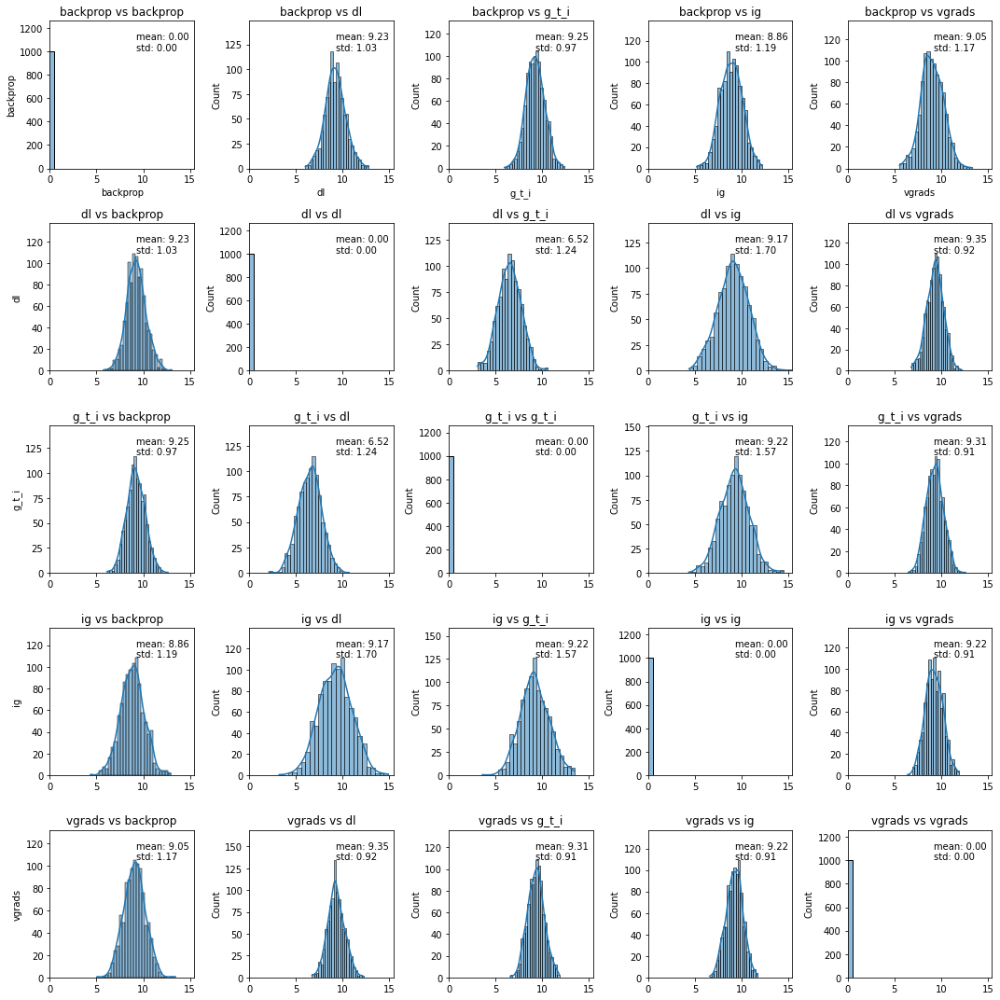

In [115]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_kcpa_linear_1), 
    techniques=list(techniques), 
    metric=METRIC
)

### RandLabels Attack

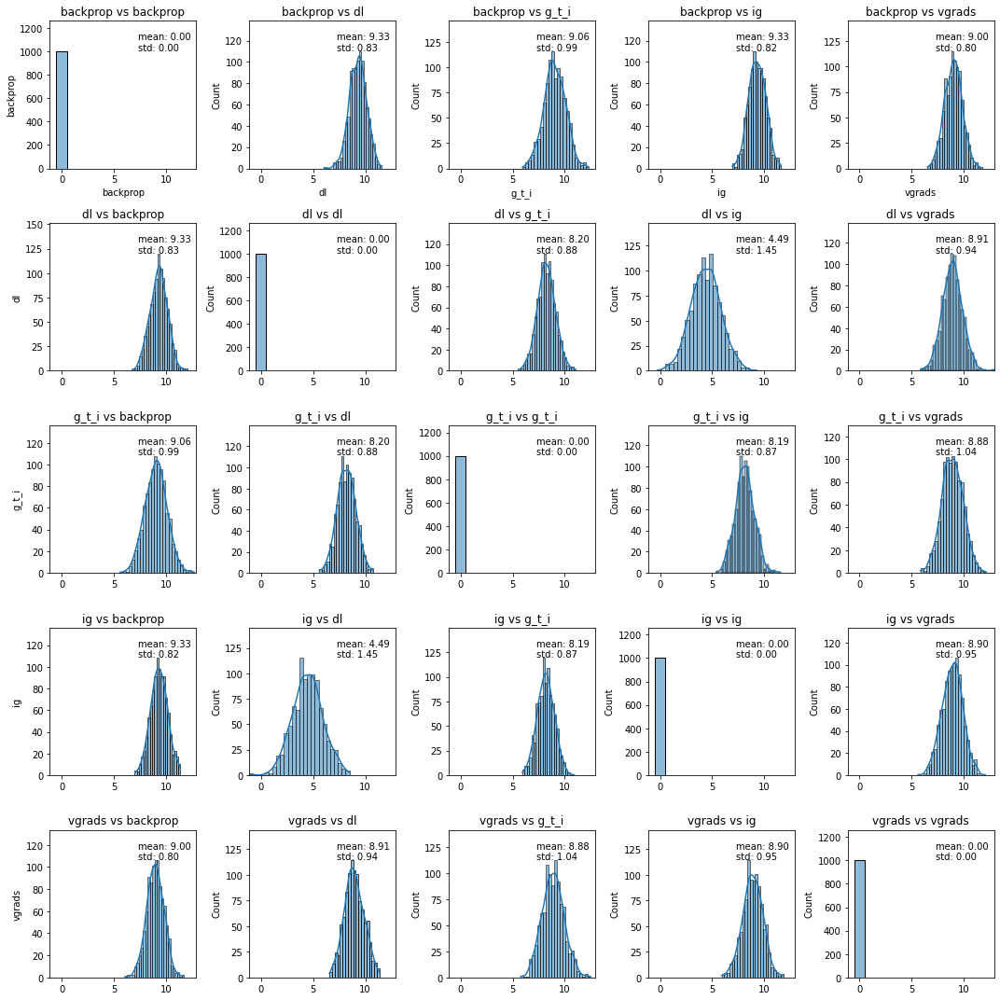

In [116]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_kcpa_linear_2), 
    techniques=list(techniques), 
    metric=METRIC
)

### RandParams Attack

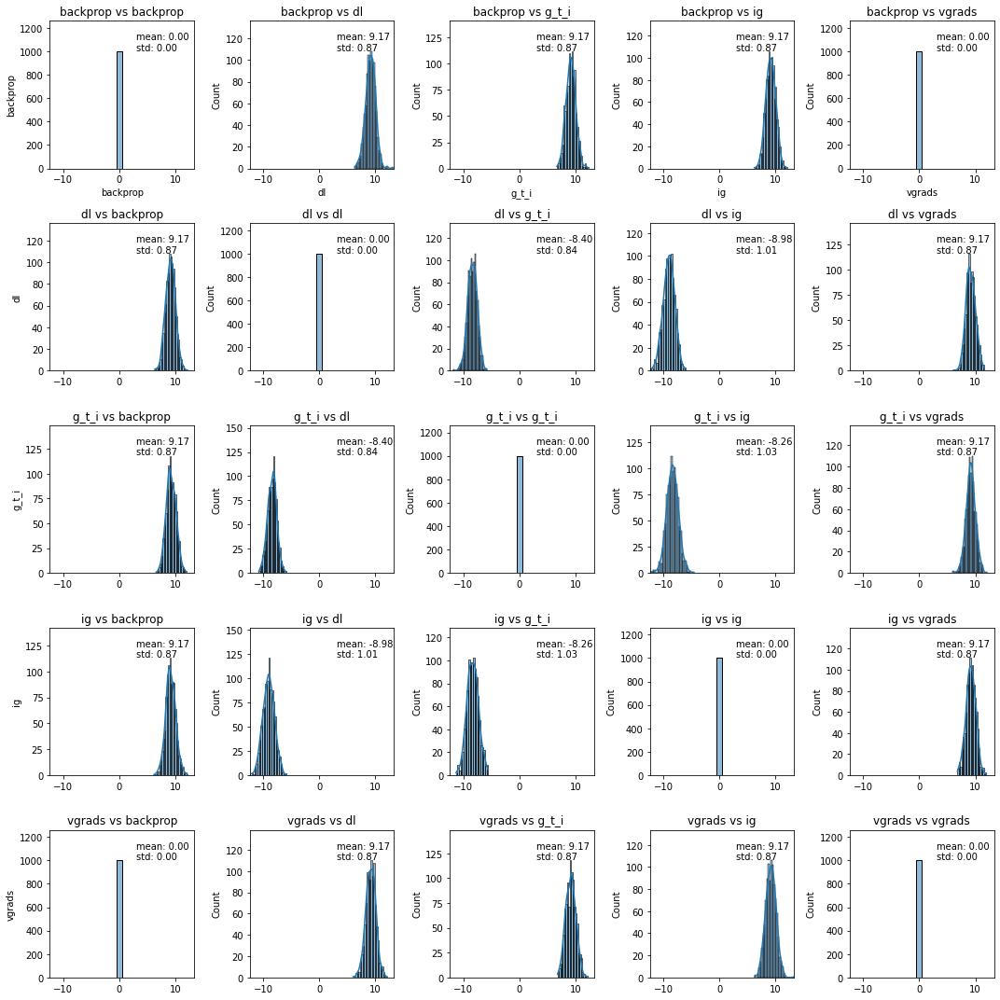

In [117]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_kcpa_linear_3), 
    techniques=list(techniques), 
    metric=METRIC
)

### No Attack vs. RandLabels (Difference)

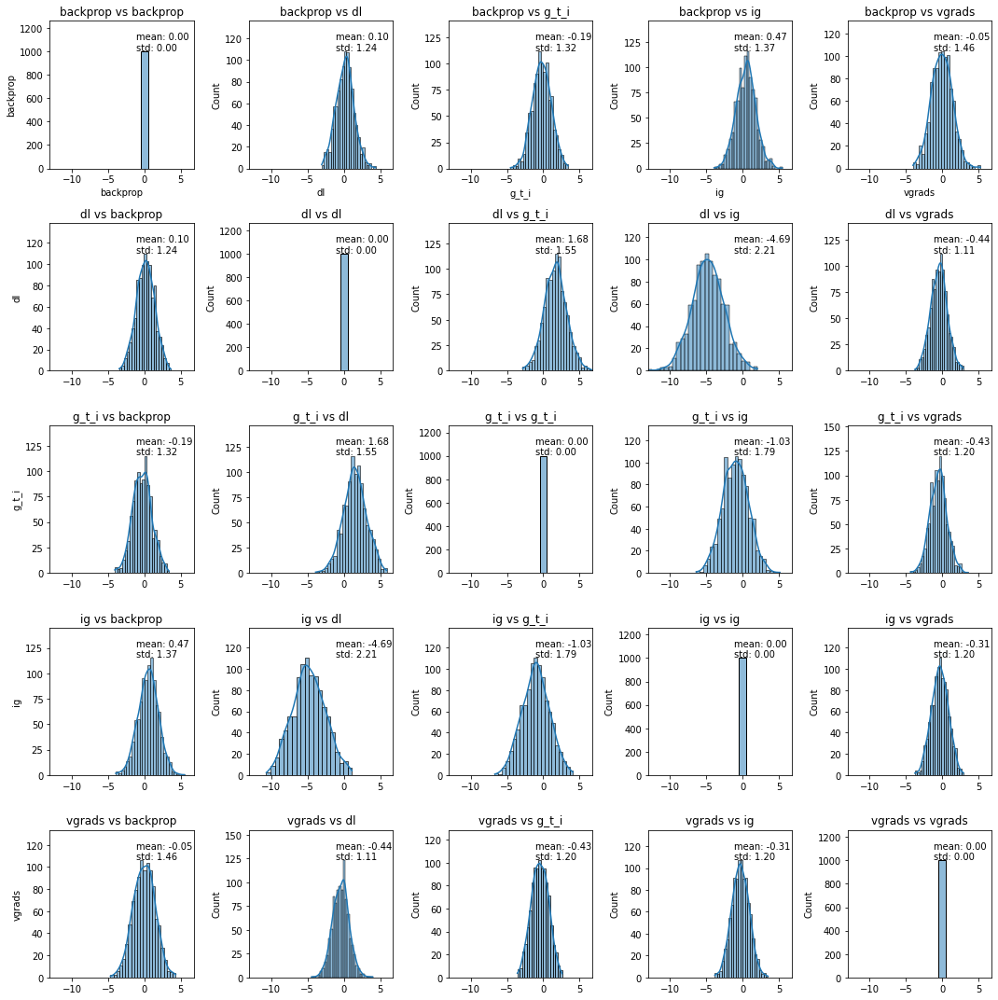

In [118]:
plot_gaussian_distributions(
    distances=difference_kpca_linear_NoAttacked_RandLabels, 
    techniques=list(techniques), 
    metric=METRIC
)

### No Attack vs. RandParams (Difference)

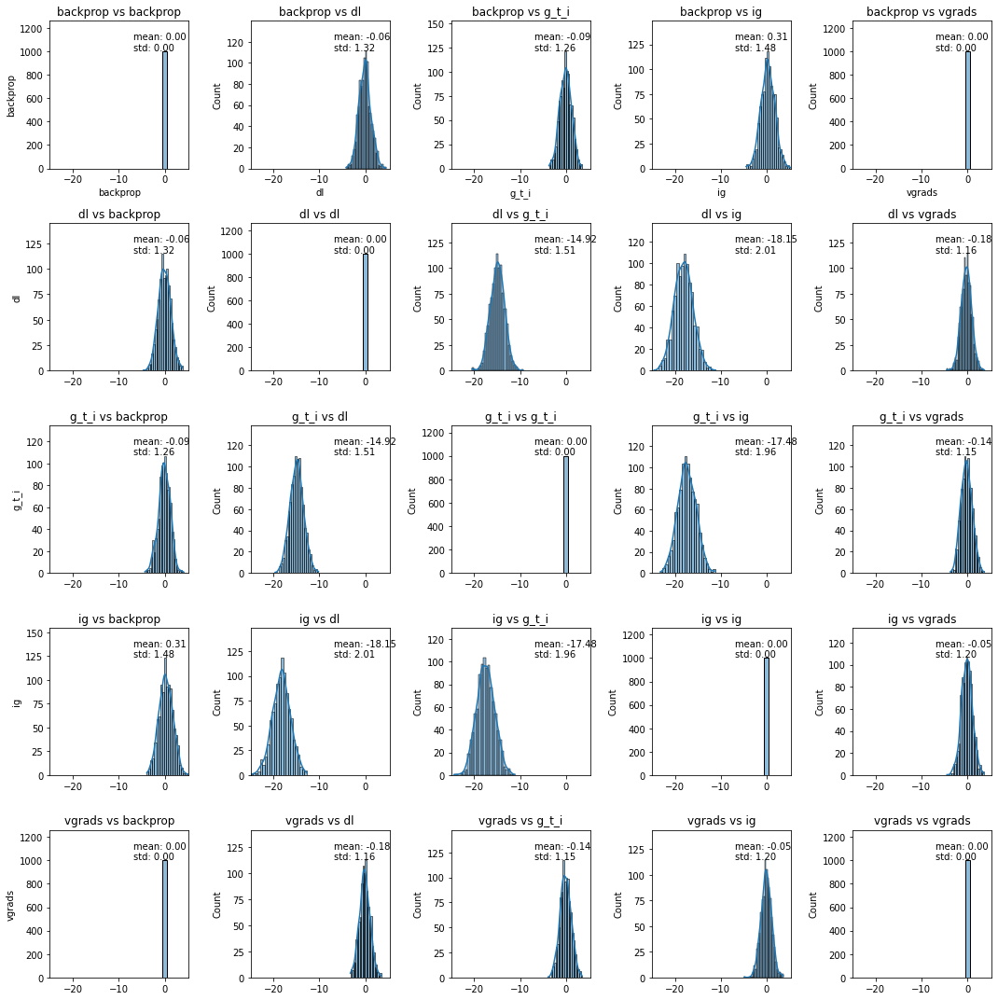

In [119]:
plot_gaussian_distributions(
    distances=difference_kpca_linear_NoAttacked_RandParams, 
    techniques=list(techniques), 
    metric=METRIC
)

## kPCA (poly)

### No Attack

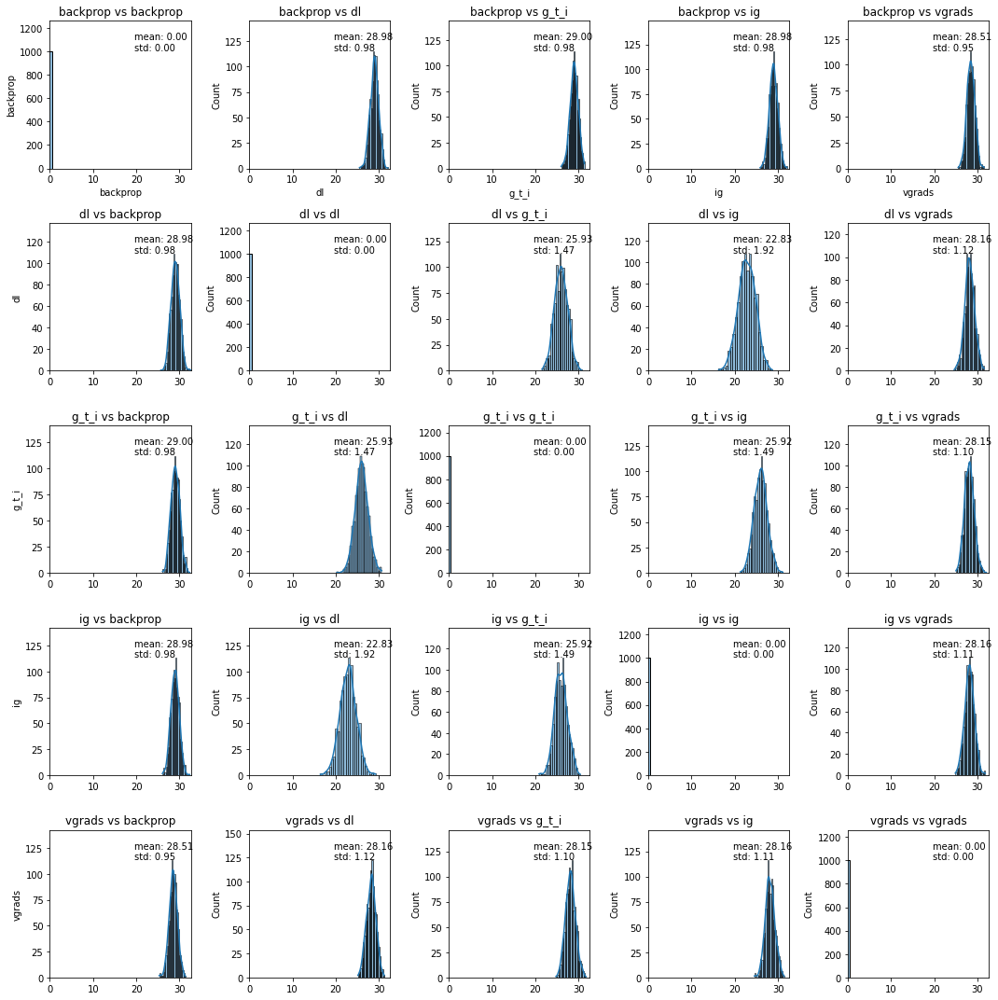

In [120]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_kcpa_poly_1), 
    techniques=list(techniques), 
    metric=METRIC
)

### RandLabels Attack

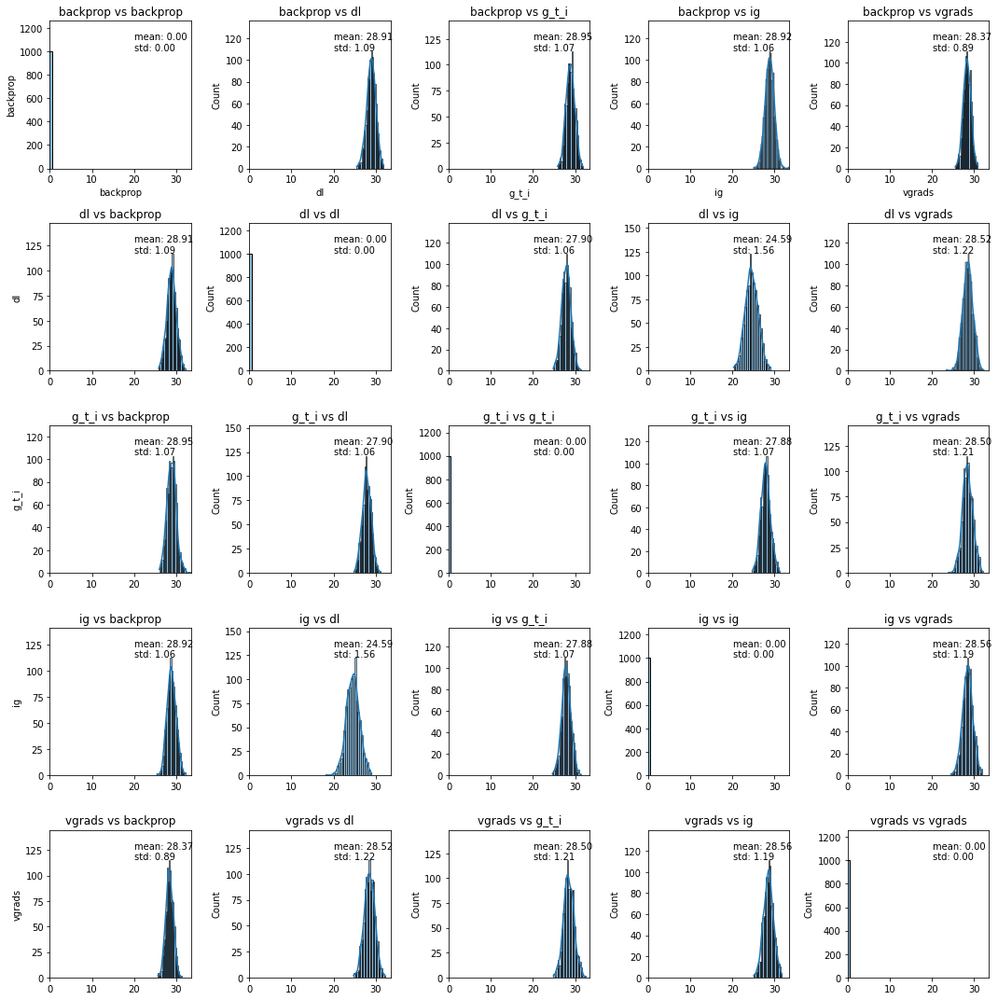

In [121]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_kcpa_poly_2), 
    techniques=list(techniques), 
    metric=METRIC
)

### RandParams Attack

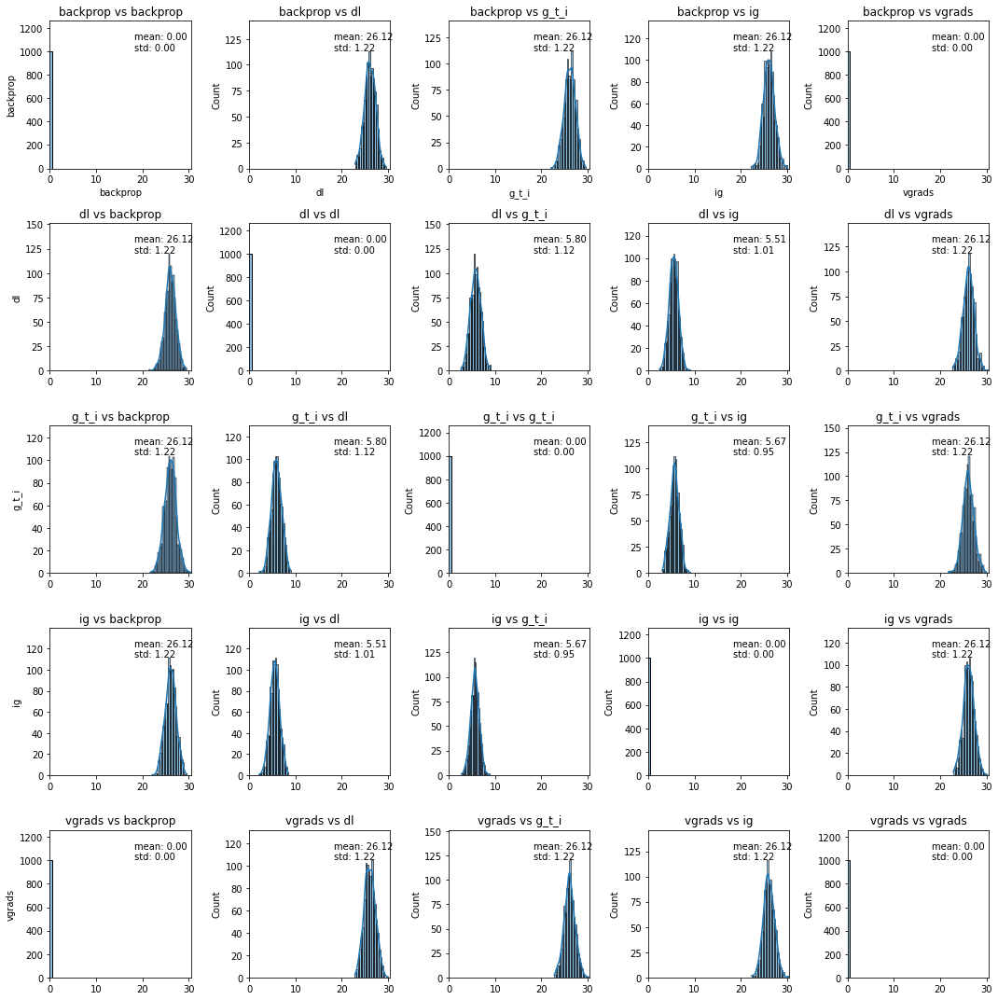

In [122]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_kcpa_poly_3), 
    techniques=list(techniques), 
    metric=METRIC
)

### No Attack vs. RandLabels (Difference)

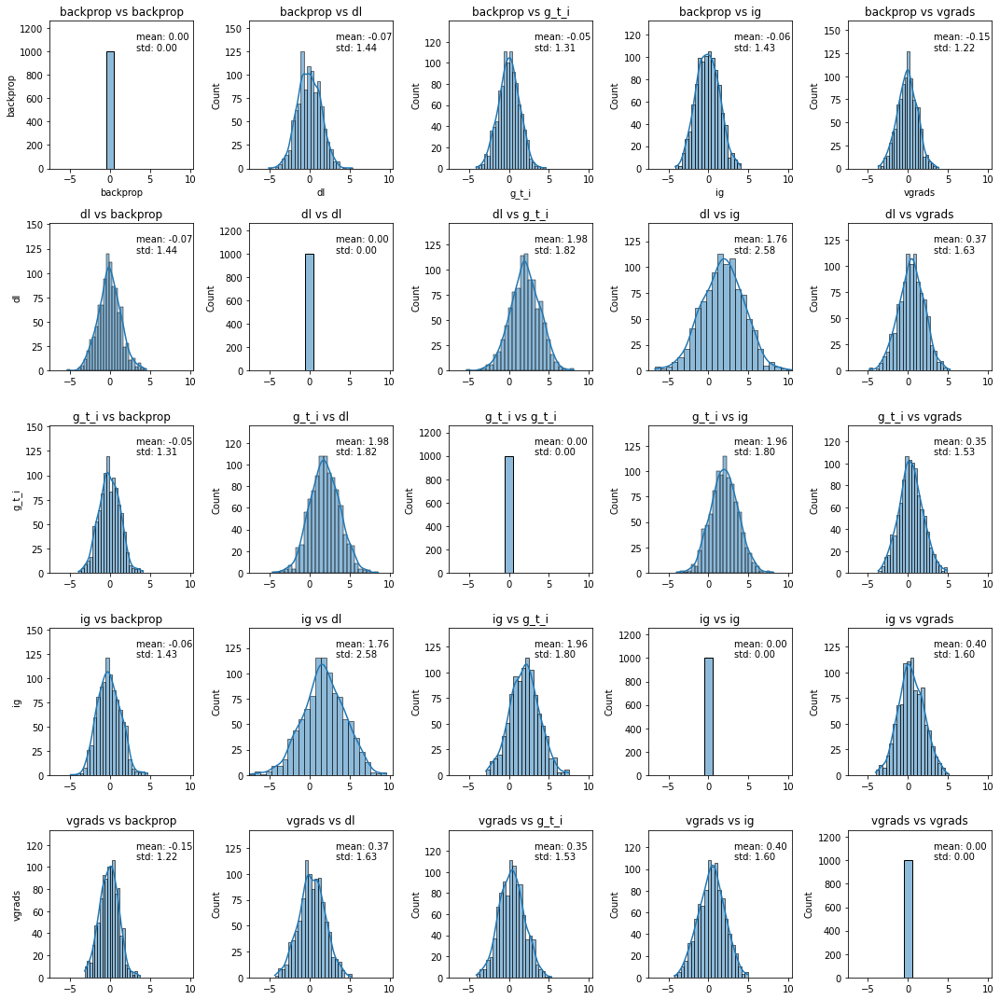

In [123]:
plot_gaussian_distributions(
    distances=difference_kpca_poly_NoAttacked_RandLabels, 
    techniques=list(techniques), 
    metric=METRIC
)

### No Attack vs. RandParams (Difference)

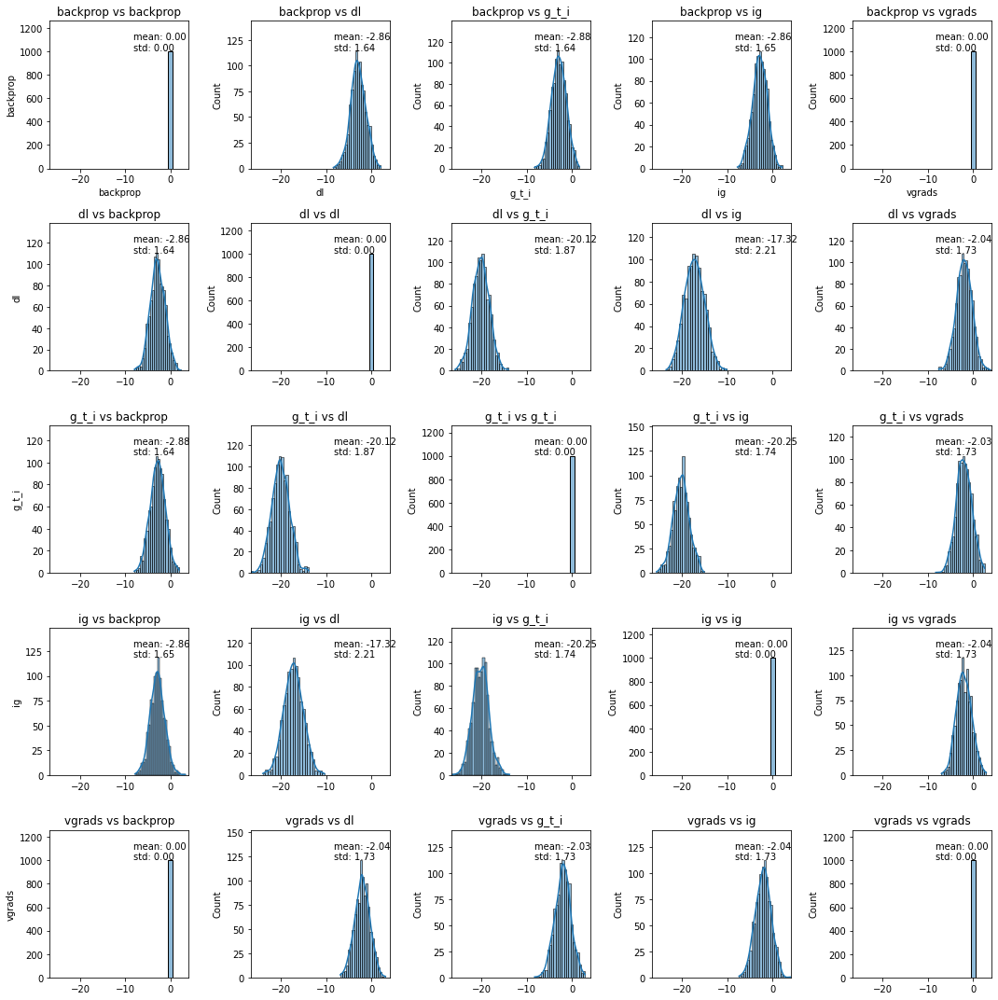

In [124]:
plot_gaussian_distributions(
    distances=difference_kpca_poly_NoAttacked_RandParams, 
    techniques=list(techniques), 
    metric=METRIC
)

## kPCA (cosine)

### No Attack

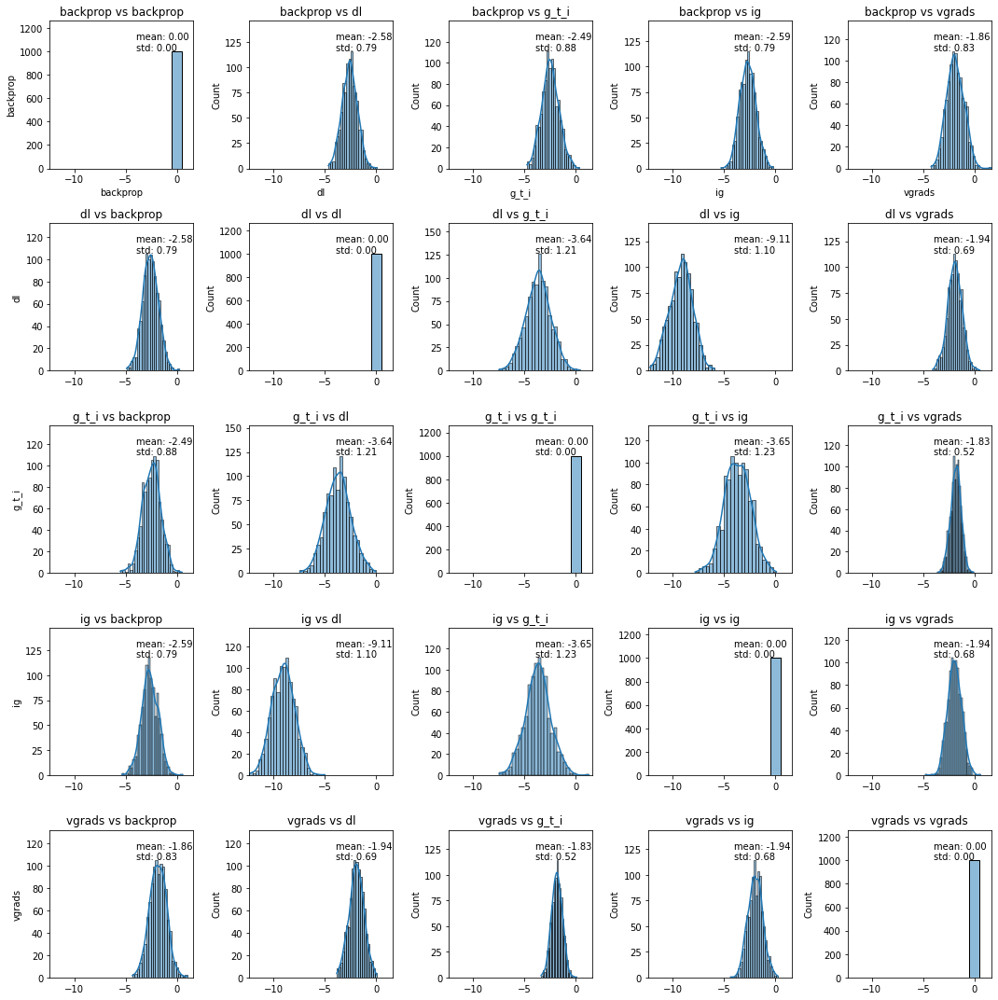

In [125]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_kcpa_cosine_1), 
    techniques=list(techniques), 
    metric=METRIC
)

### RandLabels Attack

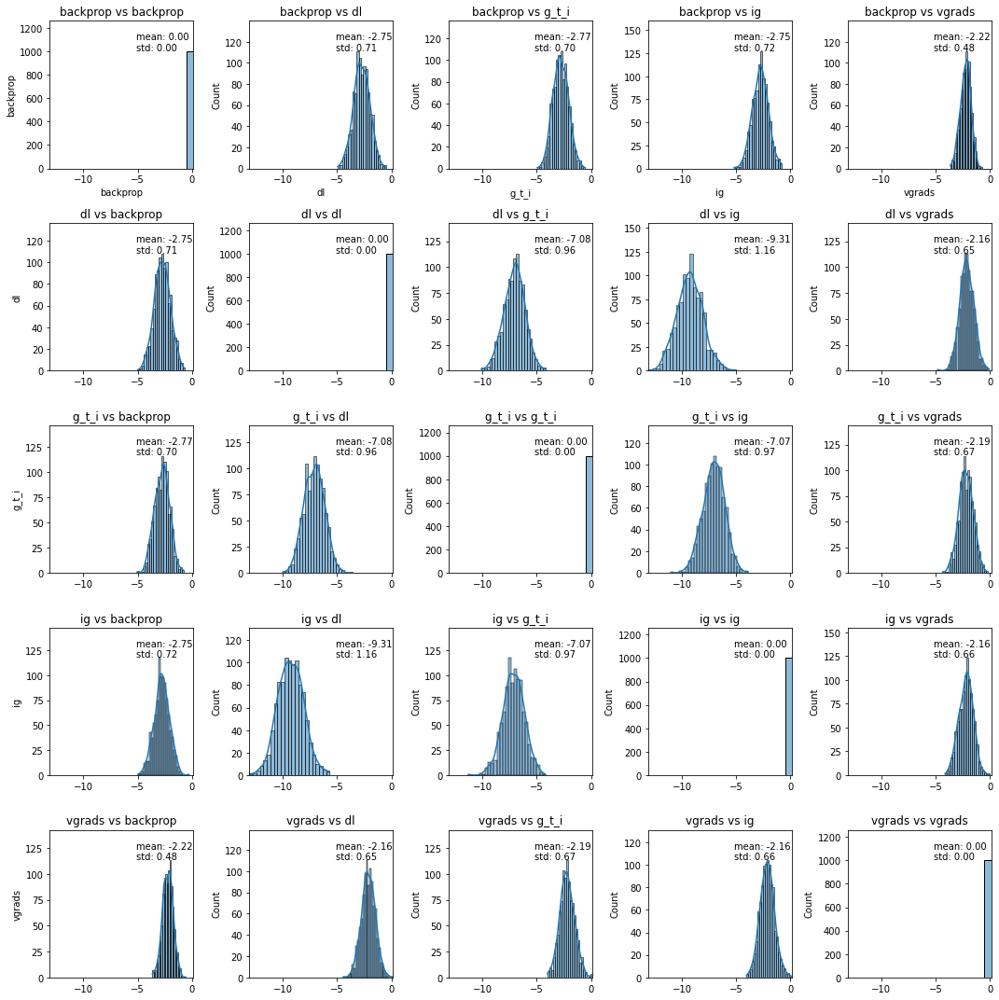

In [126]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_kcpa_cosine_2), 
    techniques=list(techniques), 
    metric=METRIC
)

### RandParams Attack

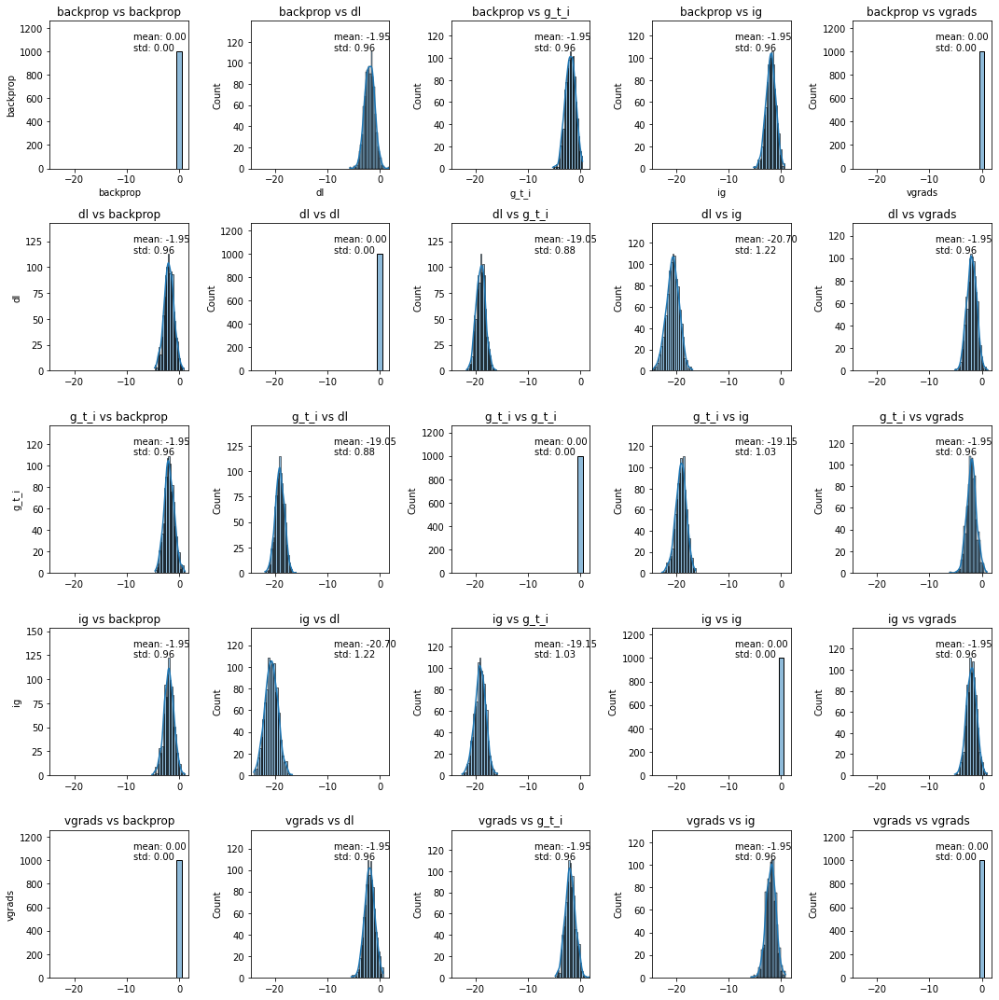

In [127]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_kcpa_cosine_3), 
    techniques=list(techniques), 
    metric=METRIC
)

### No Attack vs. RandLabels (Difference)

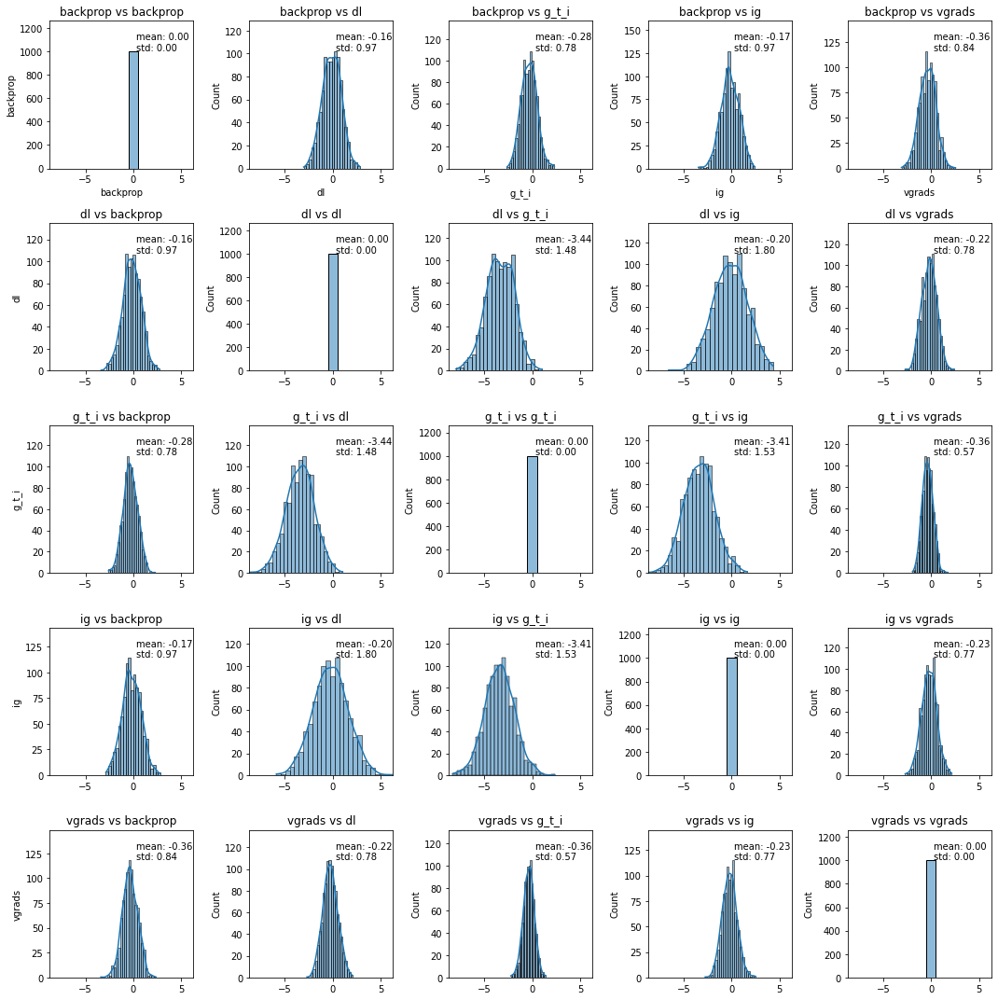

In [128]:
plot_gaussian_distributions(
    distances=difference_kpca_cosine_NoAttacked_RandLabels, 
    techniques=list(techniques), 
    metric=METRIC
)

### No Attack vs. RandParams (Difference)

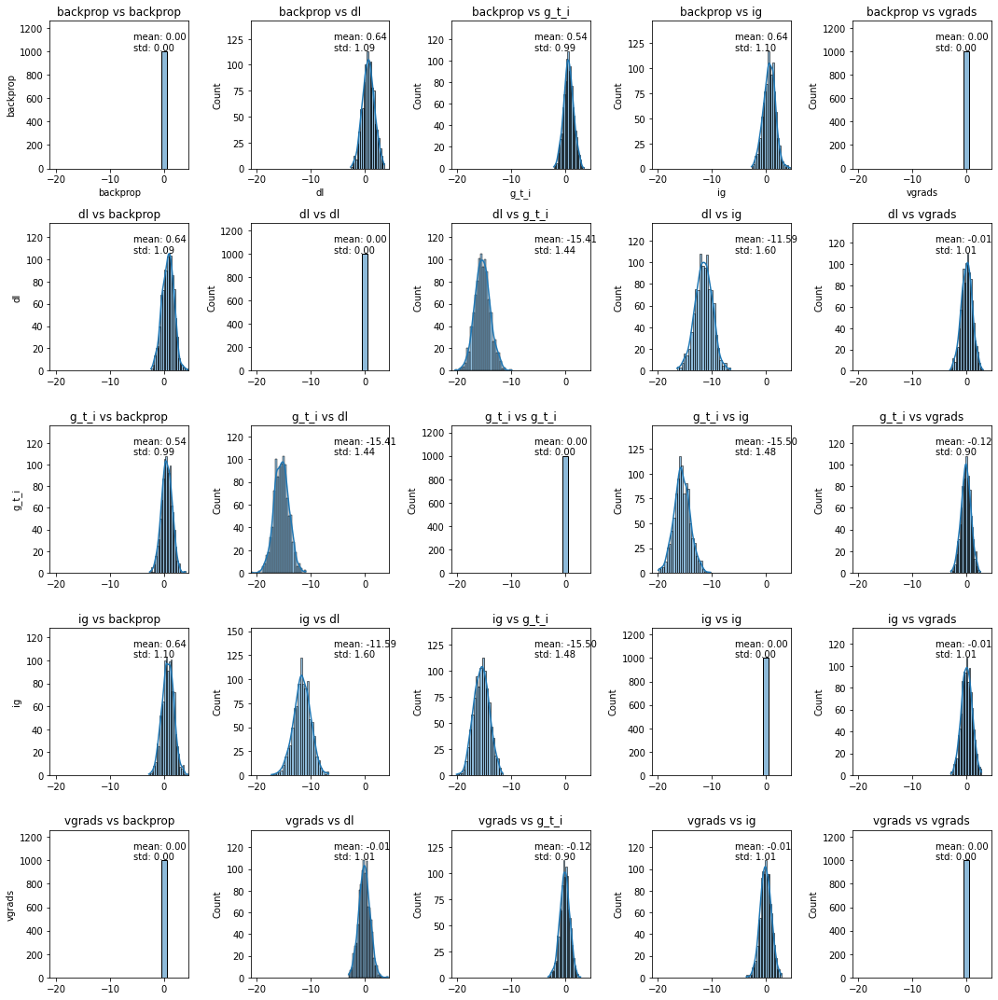

In [129]:
plot_gaussian_distributions(
    distances=difference_kpca_cosine_NoAttacked_RandParams, 
    techniques=list(techniques), 
    metric=METRIC
)

## tSNE

### No Attack

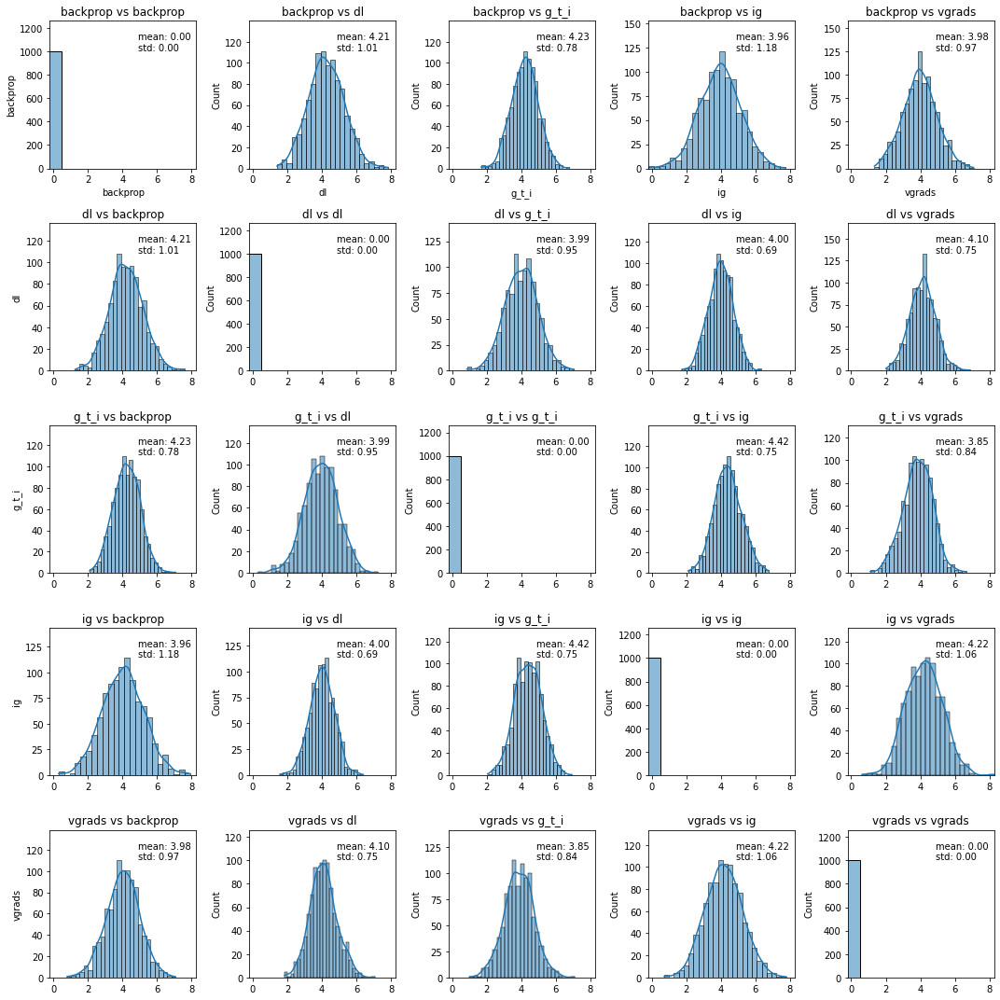

In [130]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_tsne_1), 
    techniques=list(techniques), 
    metric=METRIC
)

### RandLabels Attack

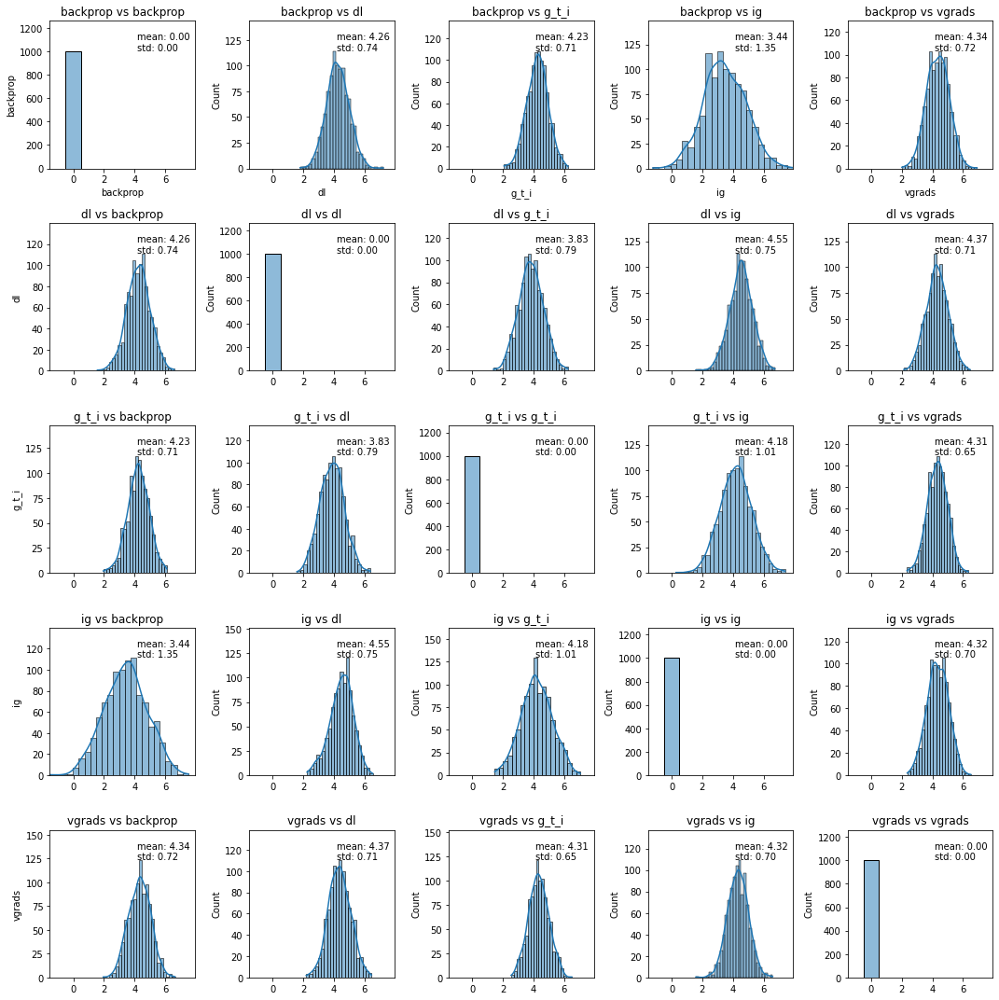

In [131]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_tsne_2), 
    techniques=list(techniques), 
    metric=METRIC
)

### RandParams Attack

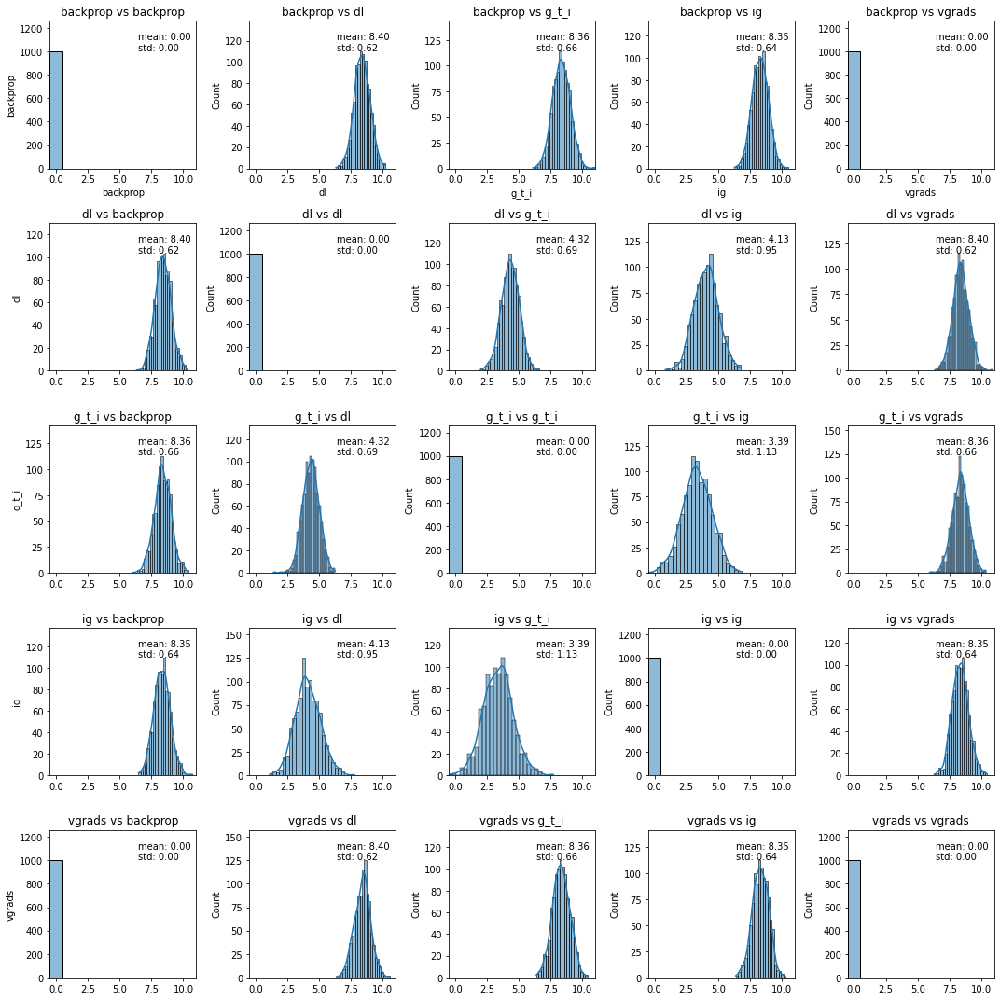

In [132]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_tsne_3), 
    techniques=list(techniques), 
    metric=METRIC
)

### No Attack vs. RandLabels (Difference)

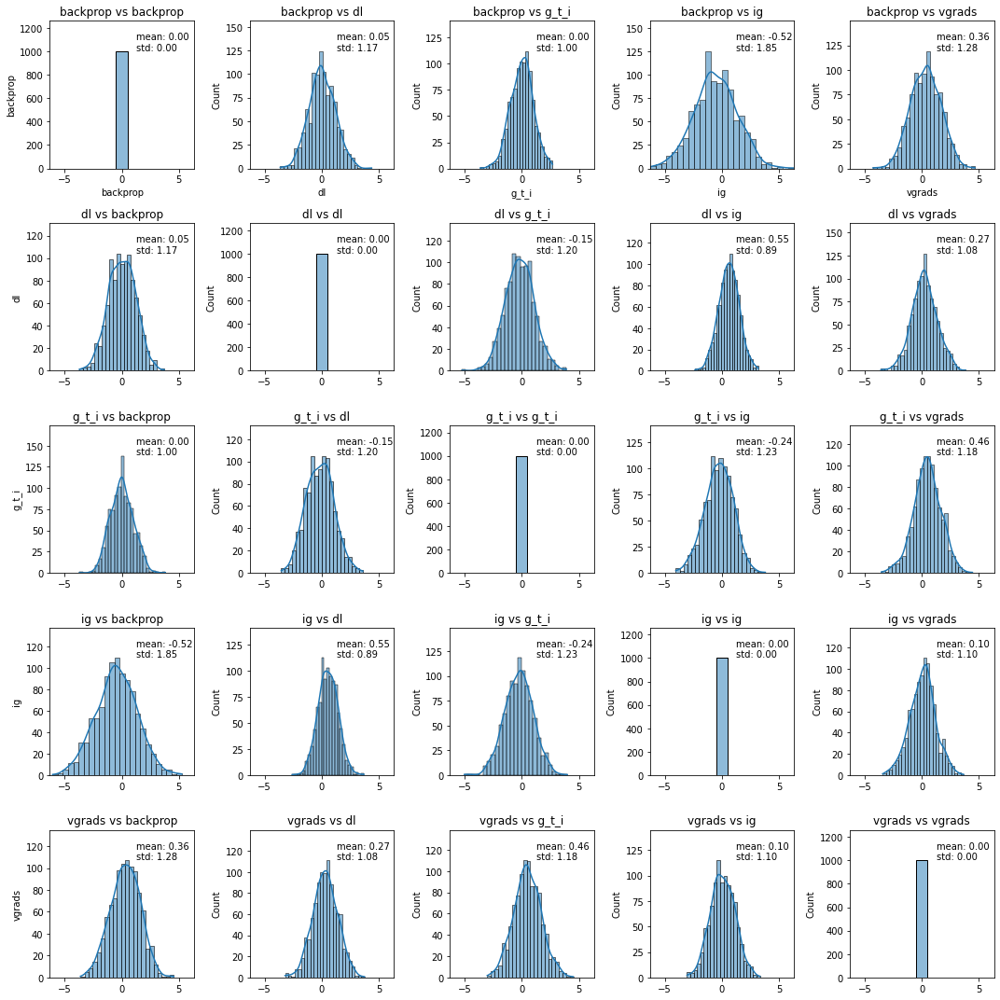

In [133]:
plot_gaussian_distributions(
    distances=difference_tsne_NoAttacked_RandLabels, 
    techniques=list(techniques), 
    metric=METRIC
)

### No Attack vs. RandParams (Difference)

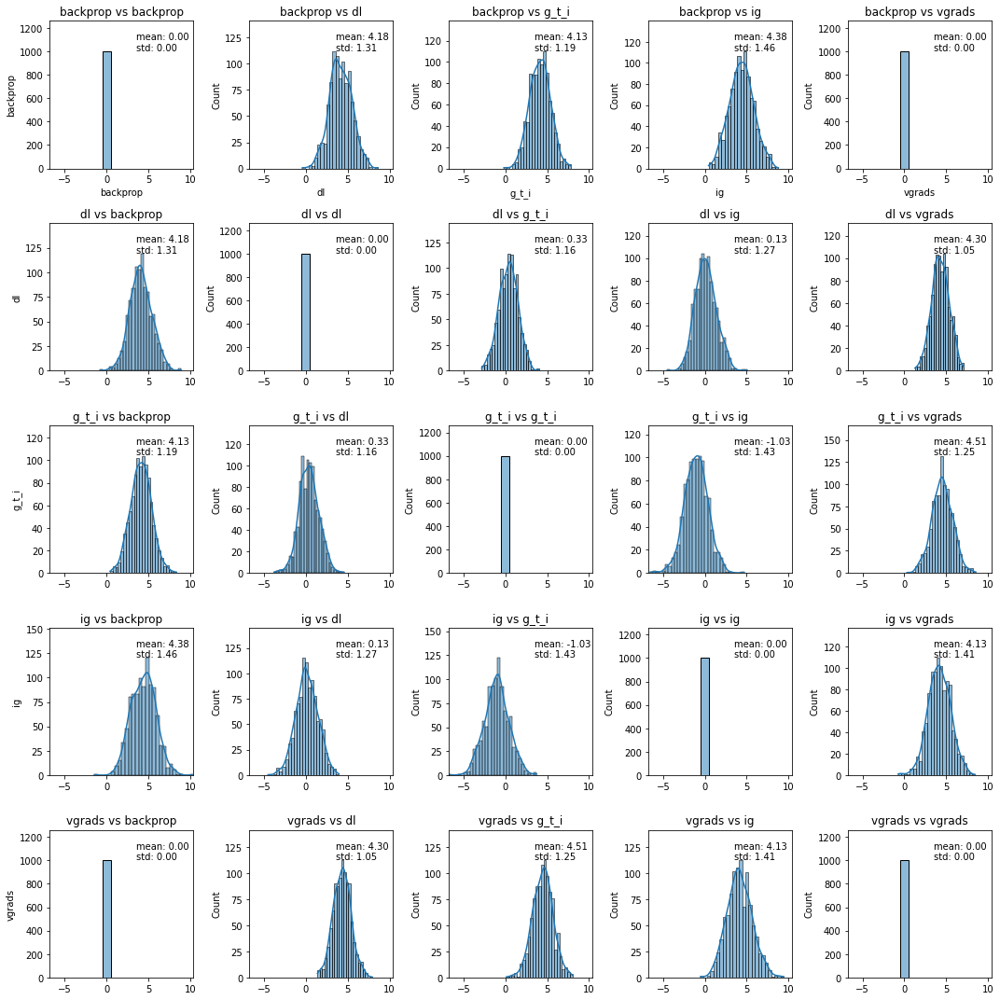

In [134]:
plot_gaussian_distributions(
    distances=difference_tsne_NoAttacked_RandParams, 
    techniques=list(techniques), 
    metric=METRIC
)